In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>''')

In [2]:
from IPython.display import Image
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as grd
import folium as fol
from sklearn import decomposition, preprocessing
from scipy import stats
from scipy.stats import shapiro, normaltest, anderson, mannwhitneyu
from branca.element import Figure
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
from scipy.stats import norm, gamma, expon, exponweib, weibull_max, genextreme, powerlaw
import scipy.stats as st
from scipy.stats import chi2
import statsmodels.api as sm
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import ShuffleSplit, StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
%matplotlib inline
pd.set_option('display.max_columns', None)

In [3]:
# Importing Listings And Reviews Data from JOJIE
def load_data(date):
    """Return AirBnb data sets as pandas.DataFrame.

    Accesses /mnt/data/public/insideairbnb/data.insideairbnb.com/japan/
    kantō/tokyo/ and loads listings and review data sets into
    pandas.Dataframe.

    Parameters
    ----------
    date : str
        Scraping date in yyy-mm-dd format

    Returns
    -------
    """

    listings_raw = pd.read_csv('/mnt/data/public/insideairbnb/'
                               'data.insideairbnb.com/japan/kantō/tokyo/'
                               f'{date}/data/listings.csv.gz',
                               compression='gzip',
                               low_memory=False,
                               parse_dates=['last_scraped', 'host_since'])

    return listings_raw

In [4]:
# Load Data from JOJIE
# lr = load_data('2021-07-20')

In [5]:
# Feature Selection, Data Cleaning, and Dummy Variable Creation
# fields = ['name',
#           'host_id',
#           'host_name',
#           'last_scraped',
#           'host_since',
#           'host_response_rate',
#           'host_is_superhost',
#           'host_listings_count',
#           'latitude',
#           'longitude',
#           'property_type',
#           'room_type',
#           'accommodates',
#           'bathrooms_text',
#           'bedrooms',
#           'beds',
#           'amenities',
#           'price',
#           'minimum_nights',
#           'maximum_nights',
#           'availability_365',
#           'number_of_reviews',
#           'review_scores_rating',
#           'review_scores_accuracy',
#           'review_scores_cleanliness',
#           'review_scores_checkin',
#           'review_scores_communication',
#           'review_scores_location',
#           'review_scores_value',
#           'reviews_per_month']

# Select fields and drop rows with missing values
# lr_select = lr[fields].dropna()

# Count the number of listed amenities
# lr_select['amenities_ct'] = lr_select['amenities'].str.strip('[]').\
# str.split(',').str.len()

# Calculate number of days as host
# lr_select['days_as_host'] = (lr_select.last_scraped -
#                              lr_select.host_since).dt.days

# Convert price to float
# lr_select['price'] = lr_select['price'].replace({'\$': '',
#                                                  ',': ''},
#                                                 regex=True).astype(float)

# Extract bathroom count from bathrooms_text
# def bathrooms(text):
#     """Extract number of bathrooms."""
#     try:
#         bath = float(text.split()[0])
#     except:
#         if 'half' in text.lower():
#             bath = 0.5
#         else:
#             bath = np.nan
#     return bath

# lr_select['bathrooms'] = lr_select['bathrooms_text'].apply(bathrooms)

# Host response rate to float
# lr_select['hrr'] = lr_select['host_response_rate'].replace({'%': ''},
#                                                            regex=True)
# lr_select['hrr'] = lr_select['hrr'].astype(float) / 100

# One-hot encoding of categorical variables
# Superhost Tagging
# OH_superhost = pd.get_dummies(lr_select.host_is_superhost,
#                             prefix='superhost',
#                             drop_first=True)

# Re-Tag Superhost
# lr_select['host_is_superhost'] = np.where(lr_select.host_is_superhost ==
# 't',
#                                           'Superhost',
#                                           'Non-Superhost')

# Drop columns
# lr_select = lr_select.drop(['amenities',
#                             'last_scraped',
#                             'host_since',
#                             'bathrooms_text',
#                             'host_response_rate'], axis=1)

# Export to csv file
# lr_select.dropna().to_csv('airbnb20210720.csv')
# OH_superhost.to_csv('OH_superhost20210720.csv')

# **Superhost, Diagnosed: Exploring the Relationship Between Host Status and Listing Characteristics of AirBnB in Tokyo, Japan**

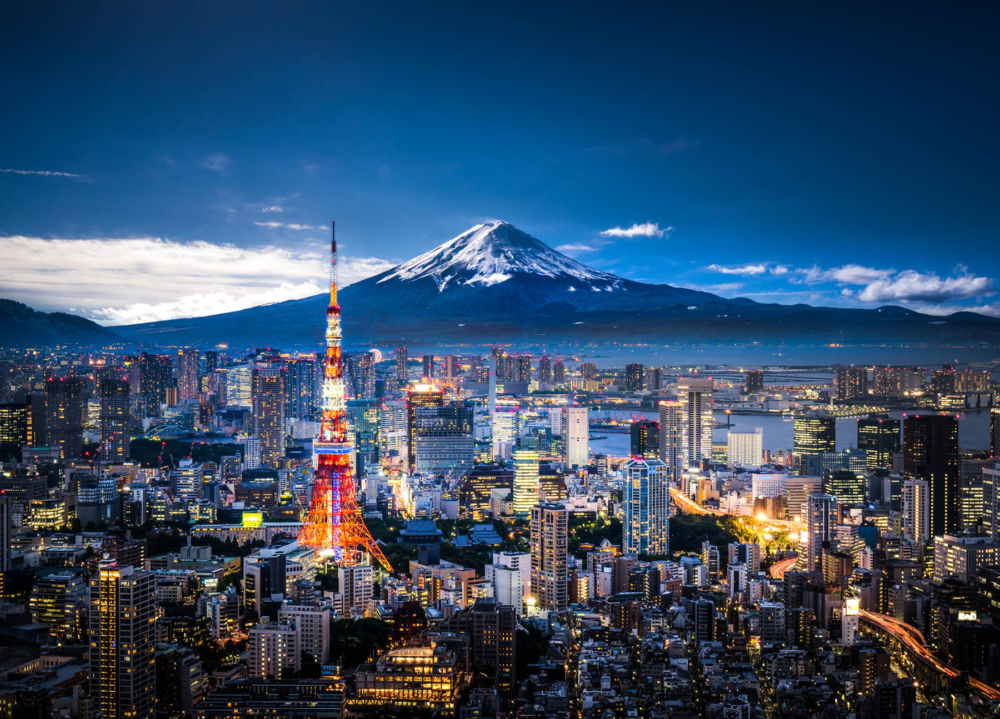

In [6]:
# Photo Source: https://wedc.org/blog/governor-evers-will-lead-trade-mission-
# to-japan-in-september/mt-fuji-and-tokyo-skyline/
Image(filename='Tokyo-Japan-skyline.jpg')

## **1.0 Executive Summary**

The start up boom has given birth to the shared economy – a system based on people sharing resources or services for a price, and leveraging on the Internet to allow for scale.  One of the most successful global examples of this is Airbnb – which has redefined and disrupted the hospitality and real estate industry by allowing hosts to list their properties for guests to book.  Airbnb distinguishes their hosts as Superhosts and Non-Superhosts, and this study focuses on Tokyo, Japan and draws data from InsideAirbnb.com to explore the relationships of listing characteristics, and comparing and contrasting them between these types of hosts. Throughout the paper, data visualization, exploratory data analysis, hypothesis testing, and resampling methods are applied.  These analysis show a number of findings, including that host type and room type appear to be non-independent, and while Superhost listings may not be priced higher, they rightfully receive better overall review scores than their Non-Superhost counterparts.  Furthermore, a classifier model was made to predict the Superhost/non-Superhost status based on listing characteristics, which was shown to achieve an accuracy of 86.5%. In building the model, cross-validation was used to provide a sense of the distributions of the training and test accuracies across different hyperparameter values, as well as showing the regions of underfitting and overfitting.

## **2.0 Introduction**

With a wide array of entertainment ranging from futuristic spectacles to traditional temples, Japan has always been a hotspot destination for travelers from around the world. The country is especially renown for its culture of hospitality and care encapsulated by the term, *omotenashi*, a Japanese way of living often studied by quality assurance practitioners. A Japanese chef has once said that *omotenashi* is the mindset of serving each guest as if it were both their first and their last time under one's care. 

This culture of care especially manifests itself in the tourism industry. In 2019, the Japan Tourism Agency said over 31.9 million overseas tourists visited the country. Tourists can consider staying in capsule hotels or traditional ryokans, but others have found practical value in booking Airbnb accommodations instead for their cost and convenience, particularly in an expensive city like Tokyo. Tourists may also look at several factors, including the host status, which may have been influenced by certain listing characteristics.

**What is a Superhost?**

Superhosts are experienced hosts who provide a shining example for other hosts, and extraordinary experiences for their guests. Once a host reaches Superhost status, a badge will automatically appear on their listing and profile to help prospective guests identify them. Quarterly reviews are done on all hosts to reward them of this sought-after badge.

Superhost status is awarded to hosts that meet the following requirements:

* Completed at least 10 trips or 3 reservations that total at least 100 nights;
* Maintained a 90% response rate or above;
* Maintained a cancellation rate of 1% or below; and
* Maintained, at least, a 4.8 overall rating

## **3.0 Problem Statement**

This study is an exploratory data analysis that looks into  the relationships of Airbnb listing characteristics, comparing and contrasting them between Superhosts and Non-Superhosts. Also, while the study aims to provide a high-level overview of the data and make general observations about the patterns and correlations among the different features, particular attention will be paid to the room type, price, and overall exerience rating scores of Airbnb listings, seeking to answer the following questions:
- What types of properties do Superhosts and non-Superhosts typically manage?
- How do Superhosts and non-Superhost Airbnb listings compare in terms of price?
- How different are Superhosts and non-Superhosts in terms of the overall rating scores they earn?

To this end, the study will apply data visualization, exploratory data analysis, and hypothesis testing to scrutinize the data characteristics.

## **4.0 Methodology**

This study consisted of various stages, giving focus on Exploratory Data Analysis (EDA) and Inferential Statistics.

The steps are described and illustrated in greater detail throughout this report, with the following summary:

1. Convert readily-available web-scraped data as at 20July2021
2. Manipulate, clean, and save data as `csv`
3. Execute Exploratory Data Analysis through descriptive statistics, plots, tables, and charts
4. Perform Inferential Statistics to test differences in distribution between Superhosts and Non-Superhosts in terms of price and overall experience rating, as well as independence between Host Type and Room Type

Through these, the objective of this study is to glean insights, compare, and contrast Airbnb listings belonging to both Superhosts and Non-Superhosts.

## **5.0 Data**

### **5.1 Data Source**

**Airbnb**

Airbnb started when two hosts welcomed three guests to their San Francisco home in 2007. Friends, Brian Chesky and Joe Gebbia thought of setting up an air mattress in their living room and turn it into a bed and breakfast. Airbed & Breakfast, now popularly known as Airbnb, was established in 2008 as an online marketplace for lodging, homestays for vacation rentals, and tourism activities. Since then it has grown to 4 million Hosts and welcomed more than 900 million guest arrivals all over the world. As of September 2020, Airbnb has 5.6 million listings over 100,000 cities around the globe.

Airbnb started its operations in Japan in 2013 and has grown rapidly since. However, in 2018, a new homesharing law called `minpaku` required hosts to register and secure permits from the government that caused listings to decrease by up to 80%, from around 60,000. It recovered the following year and raised listings to around 50,000, and additional 23,000 rooms in traditional hospitality categories like hotels and Ryokans. The COVID-19 pandemic has impacted utilization of Airbnb's globally and may slowly recover as the world improves vaccination rates and ease travel restrictions.

**InsideAirbnb.com**

Inside Airbnb is a watchdog website that scrapes and analyzes publicly available information from Airbnb's website. Founded by Murray Cox, InsideAirbnb provides data as well as insights on how Airbnb competes not just with the hotel industry, but also with the residential housing market.

### **5.1 Data Extraction and Preparation**

The data set was extracted from the readily-available raw webscraped information as of 20July2021 from the Airbnb website. This can be accessed via $Jojie$ at `/mnt/data/public/insideairbnb/data.insideairbnb.com/japan/kantō/tokyo/`. Some fields from the original data set were manipulated to retain numeric values, while some were re-assigned with values (i.e. Superhost and Non-Superhost tagging). 

After selecting fields of interest to be used in this study and dropping lines with missing values, 2 data sets were produced:
1. `airbnb20210720.csv` as the main data set with 6,617 rows. One of these has a `minimum_nights` value of 999 and were dropped in the succeeding sections.
2. `OH_superhost20210720.csv` which contains the boolean host type tagging (0 for Non-Superhost and 1 for Superhost).

The following table details the fields included in this study.

In [7]:
# The data preparation steps have been commented out in this notebook.
# For the subsequent analysis, the processed data sets have been saved as csv
# files and will be imported instead.
lr_select = pd.read_csv('airbnb20210720.csv', index_col=0)
OH_superhost = pd.read_csv('OH_superhost20210720.csv', index_col=0)

# Extract sole line with `minimum_nights` = 999
min_nights_outlier = lr_select[(lr_select.minimum_nights >= 999)]
# Drop row with minimum_nights = 999
lr_select = lr_select[(lr_select.minimum_nights < 999)].dropna()

<center><font size="3"><b>Table 1. Data Set Fields</b></font></center><br>
    
|#|Column|Non-Null Count|Dtype|Description
|:---|:------|:----|:-----|:----
|0|name|6616|object|Listing name
|1|host_id|6617|object|Host ID
|2|host_name|6618|object|Host Name
|3|host_is_superhost|6616|object|Re-tagged host type (Superhost/Non-Superhost)
|4|host_listings_count|6616|float64|Total listings under the same host
|5|latitude|6616|float64|Latitude coordinate
|6|longitude|6616|float64|Longitude coordinate
|7|property_type|6616|object|Property Type
|8|room_type|6616|object|Room Type
|9|accommodates|6616|int64|Capacity (per number of pax) of listing
|10|bedrooms|6616|float64|Count of bedrooms in listing
|11|beds|6616|float64|Count of beds in listing
|12|price|6616|float64|Price of listing in Japanese Yean
|13|minimum_nights|6616|int64|Minimum number nights per booking
|14|maximum_nights|6616|int64|Maximum number of nights per booking
|15|availability_365|6616|int64|Listing availability in the next 365 days
|16|number_of_reviews|6616|int64|Number of customer reviews
|17|review_scores_rating|6616|float64|Overall Experience Rating (0 to 5, continuous)
|18|review_scores_accuracy|6616|float64|Accuracy Rating (0 to 5, continuous)
|19|review_scores_cleanliness|6616|float64|Cleanliness Rating (0 to 5, continuous)
|20|review_scores_checkin|6616|float64|Check-in Process Rating (0 to 5, continuous)
|21|review_scores_communication|6616|float64|Host Communication Rating (0 to 5, continuous)
|22|review_scores_location|6616|float64|Location Rating (0 to 5, continuous)
|23|review_scores_value|6616|float64|Value Rating (0 to 5, continuous)
|24|reviews_per_month|6616|float64|Number of customer reviews per month
|25|amenities_ct|6616|int64|Count of listed amenities
|26|days_as_host|6616|int64|Number of days as host as of scraping date
|27|bathrooms|6616|float64|Number of bathrooms in listing
|28|hrr|6616|float64|Host Response Rate

## **6.0 Exploratory Data Analysis**

### **6.1 Geographical Distribution**

<font size="3"><b>Figure 1. Tokyo AirBnb Map by Host Type</b>

In [8]:
# Geo Map of Listings
fig3 = Figure(width=950, height=550)

# Takeshita Street in Shinjuku as Center
m3 = fol.Map(location=[35.6713, 139.7048],
             tiles='cartodbpositron',
             zoom_start=11,
             prefer_canvas=True)

# Landmarks
markers = [('Tokyo Imperial Palace', [35.6838, 139.7507], 'flag'),
           ('Tokyo Station', [35.6814, 139.7661], 'star-empty'),
           ('Tokyo Tower', [35.6586, 139.7454], 'tower'),
           ('Tokyo Skytree', [35.7101, 139.8107], 'camera'),
           ('Senso-ji Temple', [35.7148, 139.7967], 'camera'),
           ('Takeshita Street', [35.6713, 139.7048], 'camera'),
           ('Shinjuku Gyoen National Garden', [35.6852, 139.7101], 'camera'),
           ('Ikebukuro Station', [35.7295, 139.7109], 'star-empty'),
           ('Tokyo Metropolitan Government Building', [35.6896, 139.6921],
            'flag'),
           ('Shibuya Station', [35.6580, 139.7016], 'star-empty'),
           ('Don Quixote Akihabara', [35.7008, 139.7718], 'shopping-cart'),
           ('Tokyo Haneda Airport', [35.5494, 139.7798], 'plane')]

# Plotting the landmark markers onto the map
for i in markers:
    fol.Marker(location=i[1],
               popup=i[0],
               tooltip=i[0],
               icon=fol.Icon(color='red',
                             icon=i[2])).add_to(m3)
fig3.add_child(m3)

superhost = dict()

# For map ticker
for s in pd.unique(lr_select['host_is_superhost']):
    superhost[s] = fol.FeatureGroup(name=s)

# Mean and standard deviation of price - for outlier markers
price_mean = lr_select.price.mean(axis=0)
price_std = lr_select.price.std(axis=0)

# Plotting the data points on the map
for i, r in lr_select.iterrows():
    if r.host_is_superhost == 'Superhost':
        if r.price > price_mean + 3 * price_std:
            c = 'magenta'  # '#e377c2'
        else:
            c = '#ff7f0e'
    elif r.host_is_superhost == 'Non-Superhost':
        if r.price > price_mean + 3 * price_std:
            c = 'cyan'  # '#17becf'
        else:
            c = '#1f77b4'
    else:
        c = '#2ca02c'

    if r.price > price_mean + 3 * price_std:
        rad = 25
    else:
        rad = 15

    popup_string = ('NAME: ' + r['name'] +
                    f'\nHOST: {r.host_name}\nHOST ID: {r.host_id}')
    m = fol.Circle([r.latitude, r.longitude],
                   radius=rad,
                   color=c,
                   fill_color=c,
                   popup=popup_string,
                   tooltip='¥{:,.2f}'.format(r['price']))
    m.add_to(superhost[r.host_is_superhost])

for s in pd.unique(lr_select['host_is_superhost']):
    superhost[s].add_to(m3)

fol.LayerControl().add_to(m3)
m3

A map, with markers showing listing prices would be the welcome scene in Airbnb's accommodation search screen. It showcases the Superhost listings in <font color='#ff7f0e'>orange dots</font>, and Non-Superhost listings in <font color='#1f77b4'>blue dots</font>. The reader may zoom in on the map, choose which points to show by host type by clicking on the tile icon found on the upper right corner. Also, the reader may hover over the dots to see the prices and click on them to see the listing name.

Listings tend to clump around the famous neighborhoods around Tokyo, such as:
* Asakusa-Akihabara area, where Tokyo Skytree and Senso-ji are located
* Shinjuku Area
* Ikebukuro

Based on the map, Superhost and Non-Superhost listings do not seem to dominate one or the other in terms of location. Some listings that are near each other also interestingly could belong to the same hosts.

There are datapoints in the plot indicated by dots in <span style='background:gray; opacity:0.5'><font color='cyan'>cyan</font></span> and <span style='background:gray; opacity:0.5'><font color='magenta'>magenta</font></span>. These are listings with prices exceeding three standard deviations above the mean price for non-Superhosts, and Supershosts, respectively. These price distributions and outliers are explored further in the succeeding sections.

### **6.2 Descriptive Statistics**

Descriptive statistics for the whole data set were obtained as an initial step in the exploratory data analysis (EDA). It may be observed that there are features, such as `host_listing_count` and `price` which contain outliers, as determined when the 3-standard-devations rule is applied. This is evident when the maximum values in the data well exceeds three times the standard deviation. However, these were not excluded from the study data set.

<font size="3"><b>Table 2. Descriptive Statistics of Features</b></font>

In [9]:
# Exploratory Data Analysis
# Show all columns of data sets
pd.set_option('display.max_columns', None)
lr_select.describe()

,host_id,host_listings_count,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,amenities_ct,days_as_host,bathrooms,hrr
count,6.616000e+03,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000,6616.000000
mean,1.791503e+08,13.872430,35.695978,139.736214,4.644800,1.493047,2.756802,17451.577842,2.398881,617.417624,160.602328,33.837515,4.678427,4.749651,4.674819,4.807588,4.804347,4.696398,4.653671,1.199119,26.269952,1333.912636,1.289828,0.971386
std,1.115968e+08,20.350802,0.042306,0.073850,3.118503,1.083490,2.445836,41883.626060,4.573451,481.528319,114.136420,45.961136,0.381428,0.366880,0.431053,0.313443,0.354629,0.336443,0.354858,1.198459,8.044527,696.105988,0.863250,0.118748
min,7.716940e+05,0.000000,35.540750,139.129360,1.000000,1.000000,0.000000,1050.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.020000,1.000000,27.000000,0.000000,0.000000
25%,6.832835e+07,2.000000,35.683877,139.701340,2.000000,1.000000,1.000000,5000.000000,1.000000,90.000000,72.000000,5.000000,4.560000,4.670000,4.570000,4.750000,4.750000,4.570000,4.540000,0.410000,21.000000,785.000000,1.000000,1.000000
50%,1.850640e+08,7.000000,35.702670,139.732535,4.000000,1.000000,2.000000,9000.000000,1.000000,365.000000,149.000000,17.000000,4.770000,4.850000,4.800000,4.900000,4.900000,4.770000,4.710000,0.920000,26.000000,1188.500000,1.000000,1.000000
75%,2.645975e+08,18.000000,35.720363,139.788695,6.000000,2.000000,4.000000,17250.000000,2.000000,1125.000000,252.000000,44.000000,4.910000,4.970000,4.960000,5.000000,5.000000,4.930000,4.870000,1.600000,31.000000,1915.000000,1.500000,1.000000
max,4.088362e+08,129.000000,35.830640,139.911580,16.000000,30.000000,56.000000,1000000.000000,60.000000,1125.000000,365.000000,489.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,23.440000,68.000000,3670.000000,24.000000,1.000000


The descriptive statistics only apply to numerical features, however. For the categorical features, we can compare their relative proportions to each other, and for this data visualization proves useful.

<font size="3"><b>Figure 2. EDA Dashboard for Categorical Features</b></font>

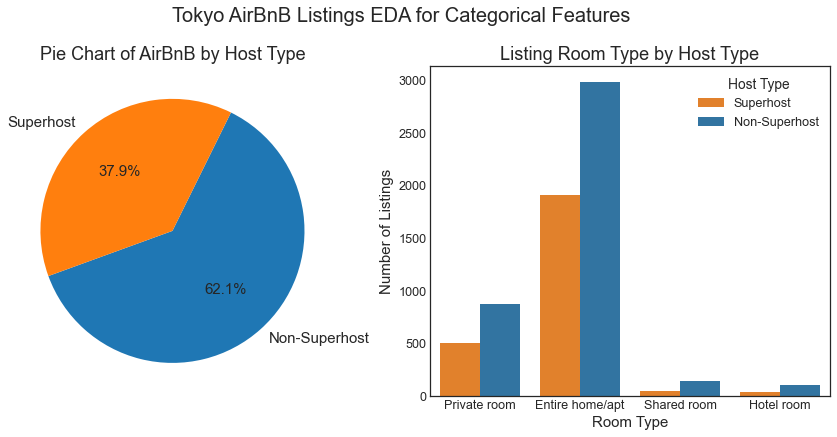

In [10]:
# Dashboard
sns.set_context('notebook', font_scale=1.15)
plt.style.use('seaborn-white')
fig = plt.figure(constrained_layout=True, figsize=(12, 10))
fig.suptitle('Tokyo AirBnB Listings EDA for Categorical Features',
             fontsize=20, y=1.05)
gs = fig.add_gridspec(4, 4)
ax0 = fig.add_subplot(gs[0:2, :2])
ax1 = fig.add_subplot(gs[0:2, 2:])

# Pie Chart
ax0.pie(lr_select.host_is_superhost.value_counts(),
        labels=lr_select.host_is_superhost.value_counts().index,
        autopct='%1.1f%%',
        startangle=-160,
        colors=['tab:blue', 'tab:orange'],
        textprops={'fontsize': 15})
ax0.set_title('Pie Chart of AirBnB by Host Type', fontsize=18)

# Countplot - Room Type
sns.countplot(x=lr_select.room_type,
              hue=lr_select.host_is_superhost,
              ax=ax1,
              palette=["C1", "C0"])
ax1.set_title('Listing Room Type by Host Type', fontsize=18)
ax1.set_xlabel('Room Type', fontsize=15)
ax1.set_ylabel('Number of Listings', fontsize=15)
ax1.legend(title='Host Type')

plt.show()

From the plots, the following may be observed.
* Majority of the listings belong to Non-Superhosts.
* Majority of listings are `Entire home/apt`.

It also appears that room type distributions of the host types are quite similar to each other, regardless of whether rooms are managed by a Superhost or not. Rather than rely on visual inspection however, whether or not the Superhost vs Non-Superhost features are statistically independent is explored in the subsequent section. For now, the conditional and marginal probabities are tabulated based on a frequentist approach.


<font size="3"><b>Table 3. Frequency Table for Host Type and Room Type</b></font>

In [11]:
contingency_table = lr_select.groupby(['host_is_superhost',
                                       'room_type'])['room_type'].count(
                                     ).unstack()
contingency_table['Total'] = contingency_table.sum(axis=1)
contingency_table.loc['Total'] = contingency_table.sum(axis=0)
contingency_table

room_type,Entire home/apt,Hotel room,Private room,Shared room,Total
host_is_superhost,,,,,
Non-Superhost,2988,104,877,142,4111
Superhost,1908,41,506,50,2505
Total,4896,145,1383,192,6616


<font size="3"><b>Table 4. Joint and Marginal Probabilities for Host Type and Room Type</b></font>

In [12]:
prob_table = contingency_table / contingency_table.loc['Total', 'Total']
prob_table

room_type,Entire home/apt,Hotel room,Private room,Shared room,Total
host_is_superhost,,,,,
Non-Superhost,0.451632,0.015719,0.132557,0.021463,0.621372
Superhost,0.288392,0.006197,0.076481,0.007557,0.378628
Total,0.740024,0.021917,0.209039,0.029021,1.000000


Having plotted the relative proportions of categorical features, it makes sense to plot the distributions of the numerical features as well, to augment the descriptive statistics computed earlier and provide a visual aid to understanding the data. For this, frequency distribution plots are used, in particular histograms along with superimposed kernel density estimate (KDE) plots. The frequency distributions for Superhosts vs Non-Superhosts are shown together, to aid comparison.

<font size="3"><b>Figure 3. EDA Dashboard for Numerical Features (Histograms and KDE Plots)</b></font>

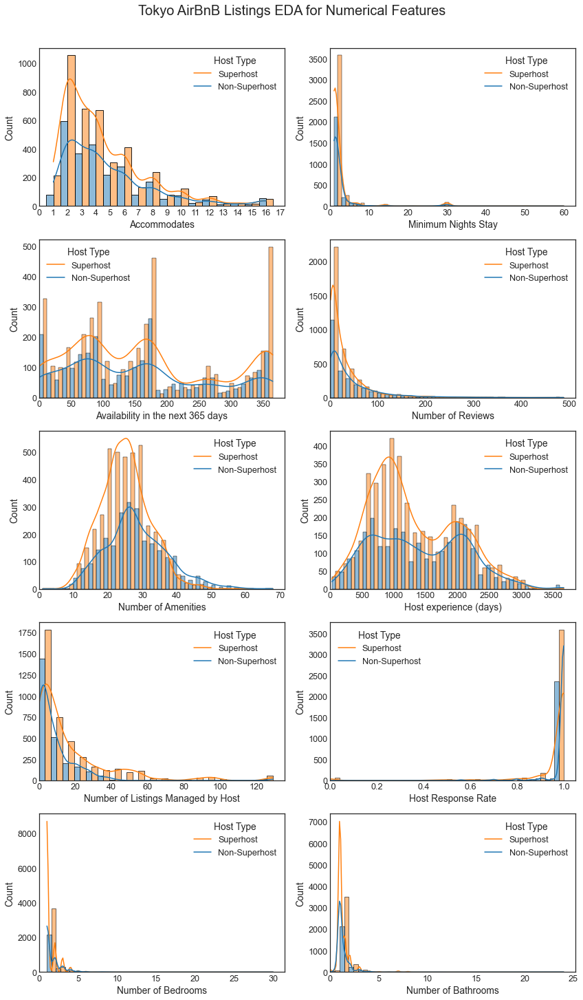

In [13]:
fig, ax = plt.subplots(5, 2, figsize=(12, 20))
fig.suptitle('Tokyo AirBnB Listings EDA for Numerical Features',
             fontsize=20, y=1.01)

sns.histplot(x=lr_select.accommodates, bins=20,
             hue=lr_select.host_is_superhost, multiple='dodge', ax=ax[0, 0],
             discrete=True, kde=True)
ax[0, 0].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[0, 0].set_xticks(range(0, 18))
ax[0, 0].set_xlim(0,)
ax[0, 0].set_xlabel('Accommodates')

sns.histplot(x=lr_select.minimum_nights, bins=30,
             hue=lr_select.host_is_superhost, multiple='dodge', ax=ax[0, 1],
             kde=True)
ax[0, 1].legend(title='Host Type', loc='upper right', labels=['Superhost',
                                                              'Non-Superhost'])
ax[0, 1].set_xlim(0,)
ax[0, 1].set_xlabel('Minimum Nights Stay')

sns.histplot(x=lr_select.availability_365, bins=30,
             hue=lr_select.host_is_superhost, ax=ax[1, 0], multiple='dodge',
             kde=True)
ax[1, 0].legend(title='Host Type', loc='best',
                labels=['Superhost', 'Non-Superhost'])
ax[1, 0].set_xticks(range(0, 400, 50))
ax[1, 0].set_xlim(0,)
ax[1, 0].set_xlabel('Availability in the next 365 days')

sns.histplot(x=lr_select.number_of_reviews, bins=30,
             hue=lr_select.host_is_superhost, ax=ax[1, 1], multiple='dodge',
             kde=True)
ax[1, 1].legend(title='Host Type', loc='upper right',
                labels=['Superhost', 'Non-Superhost'])
ax[1, 1].set_xlim(0,)
ax[1, 1].set_xlabel('Number of Reviews')

sns.histplot(x=lr_select.amenities_ct, bins=30,
             hue=lr_select.host_is_superhost, ax=ax[2, 0], multiple='dodge',
             kde=True)
ax[2, 0].legend(title='Host Type', loc='upper right',
                labels=['Superhost', 'Non-Superhost'])
ax[2, 0].set_xlim(0,)
ax[2, 0].set_xlabel('Number of Amenities')

sns.histplot(x=lr_select.days_as_host, bins=30,
             hue=lr_select.host_is_superhost, ax=ax[2, 1], multiple='dodge',
             kde=True)
ax[2, 1].legend(title='Host Type', loc='upper right',
                labels=['Superhost', 'Non-Superhost'])
ax[2, 1].set_xlim(0,)
ax[2, 1].set_xlabel('Host experience (days)')

sns.histplot(x=lr_select.host_listings_count, bins=20, multiple='dodge',
             kde=True, hue=lr_select.host_is_superhost, ax=ax[3, 0])
ax[3, 0].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[3, 0].set_xlabel('Number of Listings Managed by Host')
ax[3, 0].set_xlim(0,)

sns.histplot(x=lr_select.hrr, bins=25, multiple='dodge', kde=True,
             hue=lr_select.host_is_superhost, ax=ax[3, 1])
ax[3, 1].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[3, 1].set_xlabel('Host Response Rate')
ax[3, 1].set_xlim(0,)

sns.histplot(x=lr_select.bedrooms, bins=25, multiple='dodge', kde=True,
             hue=lr_select.host_is_superhost, ax=ax[4, 0])
ax[4, 0].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[4, 0].set_xlabel('Number of Bedrooms')
ax[4, 0].set_xlim(0,)

sns.histplot(x=lr_select.bathrooms, bins=25, multiple='dodge', kde=True,
             hue=lr_select.host_is_superhost, ax=ax[4, 1])
ax[4, 1].legend(title='Host Type', labels=['Superhost', 'Non-Superhost'])
ax[4, 1].set_xlabel('Number of Bathrooms')
ax[4, 1].set_xlim(0,)

fig.tight_layout()
plt.show()

For the numerical features, the following was observed from the frequency plots:
* The distribution of the maximum number of people accommodated by each listing appears unsurprisingly right-skewed, with the majority of listings accommodating 5 people or less.
* The vast majority of listings allow guests to book for a minimum of only 1 or 2 nights, however the distribution if skewed by outliers which require a minimum of 60 days' stay, akin to a short-term lease.
* Distribution of availability in the next 365 days for Superhosts seems right-skewed compared to availability of non-Superhosts. In either case, the distribution appears multi-modal, very likely depending on the calendar settings of the different hosts (hosts are able to restrict booking availability to the next month, quarter, half-year, or full year).
* The number of reviews earned by listings also has a steep assymetric distribution, which skews to the right. The distribution for Superhosts vs Non-Superhosts appear similar, except that Superhosts have earned more reviews.
* The distribution for the number of amenities appears the most roughly symmetric among all these features, however it is still not convincingly bell-curved. The distribution for Superhosts appears to skew heavier to the left, and for non-Superhosts, to the right.
* Host experience in number of days also appears to be multi-modal, and differs significantly between Superhosts and non-Superhosts.
* The number of other listings managed by hosts is assymetric as well, skewing to the right, indicating that most hosts only manage a few properties, but that there are outlier hosts managing over a hundred rental properties. Superhosts seem to tend to manage more listings than non-Superhosts, as shown by the outliers.
* In the vast majority of cases, hosts respond close to 100% of the time, although there are outlier hosts whose response rate is close to 0%.
* The number of bathrooms and the number of bedrooms follow similar distributions, skewing steeply to the right.


One might observe that some noteworth features were not included in the above EDA plots, namely, price and review scores. These would be of particular interest to any traveler who would want to get the best value, satisfaction, and level of service for their budget. For this reason these features will be the focus of subsequent sections.

### 6.3 Price Distributions

As noted previously, there are listings which are outliers in terms of their cost to book, with prices well exceeding three standard deviations above the mean. (Since the data is non-negative, and the standard deviation exceeds the mean, only the positive-side outliers can be considered.)

The succeeding table shows a summary of these outlying listings, using quartiles to describe the outliers' price distribution.

<font size="3"><b>Table 5. Number and Distribution of Price Outliers</b></font>

In [14]:
# Price Outliers
def percentile(n):
    def percentile_(x):
        return x.quantile(n)
    percentile_.__name__ = 'percentile_{:2.0f}'.format(n*100)
    return percentile_


outliers = (lr_select[lr_select.price > price_mean + 3 * price_std].
            pivot_table(index='host_is_superhost',
                        values='price',
                        aggfunc=['count', 'min', percentile(.25),
                                 'median', percentile(.75), 'max']))
outliers.columns = ['count', 'min', '25%', '50%', '75%', 'max']
outliers

,count,min,25%,50%,75%,max
host_is_superhost,,,,,,
Non-Superhost,43,145714.0,187143.0,200000.0,255000.0,1000000.0
Superhost,28,145714.0,150000.0,176714.0,282857.0,600000.0


Outliers aside, it is interesting to explore the price distributions of Airbnb listings in Tokyo, before proceeding to comparing the mean price of Superhosts vs Non-Superhosts. Similar to the previous EDA plots, distribution plots of prices for both types of hosts were constructed.

**Figure 4. Histogram and KDE Plot of Superhost Prices**

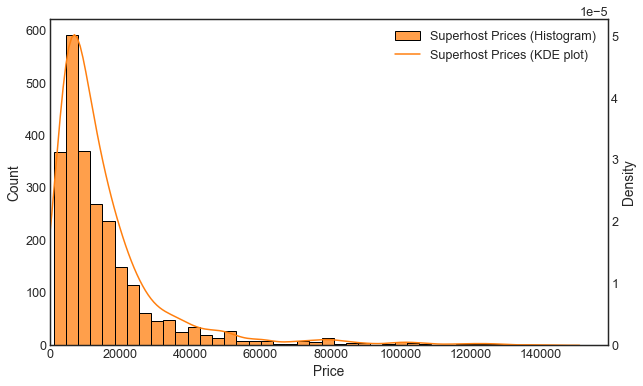

In [15]:
superhost_price = lr_select[(lr_select.price < price_mean + 3 * price_std) &
                            (lr_select.host_is_superhost == 'Superhost')
                            ]['price']

fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=superhost_price, bins=40, ax=ax1, color='tab:orange',
             label='Superhost Prices (Histogram)')
ax1.set_xlabel('Price')
ax2 = ax1.twinx()
sns.kdeplot(x=superhost_price, ax=ax2, label='Superhost Prices (KDE plot)',
            color='tab:orange')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0,)
plt.show()

**Figure 5. Histogram and KDE Plot of Non-Superhost Prices**

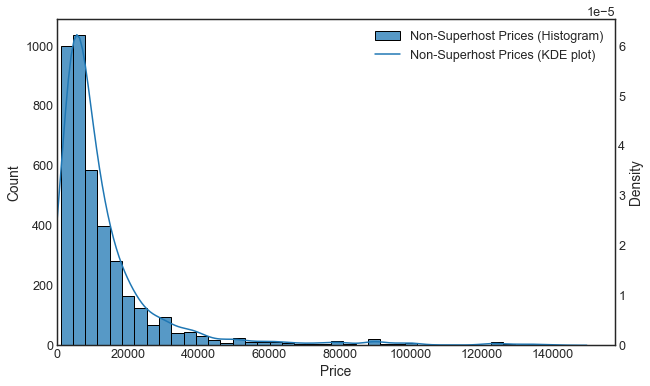

In [16]:
nonsuperhost_price = lr_select[(lr_select.price < price_mean + 3 * price_std) &
                               (lr_select.host_is_superhost == 'Non-Superhost')
                               ]['price']

fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=nonsuperhost_price, bins=40, ax=ax1,
             label='Non-Superhost Prices (Histogram)')
ax1.set_xlabel('Price')

ax2 = ax1.twinx()
sns.kdeplot(x=nonsuperhost_price, ax=ax2,
            label='Non-Superhost Prices (KDE plot)')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0,)
plt.show()

It appears from both plots that the price distribution is heavily right-tailed, with the bulk of listings having prices below 20000 Japanese yen, but with some very expensive listings skewing the distributions to the right. It also appears based on visual inspection of the prices for Superhosts tends to be somewhat higher compared to non-Superhosts.

To provide more rigor on these observations, these  price distributions will be explored and compared in greater detail in a later section.


Before moving on to other features, it would also be interesting to explore the geographical distribution of Airbnb listing prices, to see if certain areas of Tokyo tend to be more expensive than others.

<font size="3"><b>Figure 6. Price Heat Map - Superhost, Excluding Outliers</b>

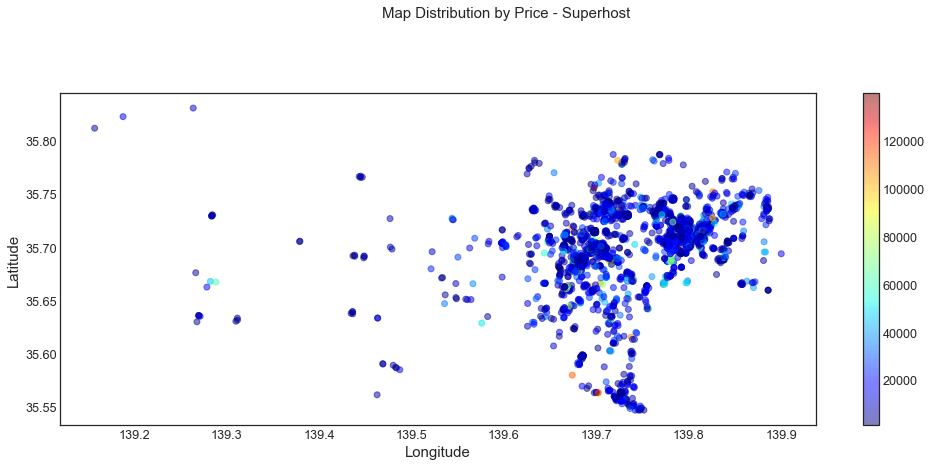

In [17]:
superhost_no_outliers = (
    lr_select[(lr_select.host_is_superhost == 'Superhost') &
              (lr_select.price <= price_mean + 3 * price_std)]
)

plt.style.use('seaborn-white')
plt.figure(figsize=(15, 7))
plt.scatter(x=superhost_no_outliers['longitude'],
            y=superhost_no_outliers['latitude'],
            c=superhost_no_outliers['price'],
            cmap=plt.get_cmap('jet'),
            alpha=0.5)
plt.colorbar()
plt.suptitle("Map Distribution by Price - Superhost", fontsize=15)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.tick_params(bottom=True, labelbottom=True)
plt.tight_layout(pad=3)
plt.show()

<font size="3"><b>Figure 7. Price Heat Map - Non-Superhost, Excluding Outliers</b></font>

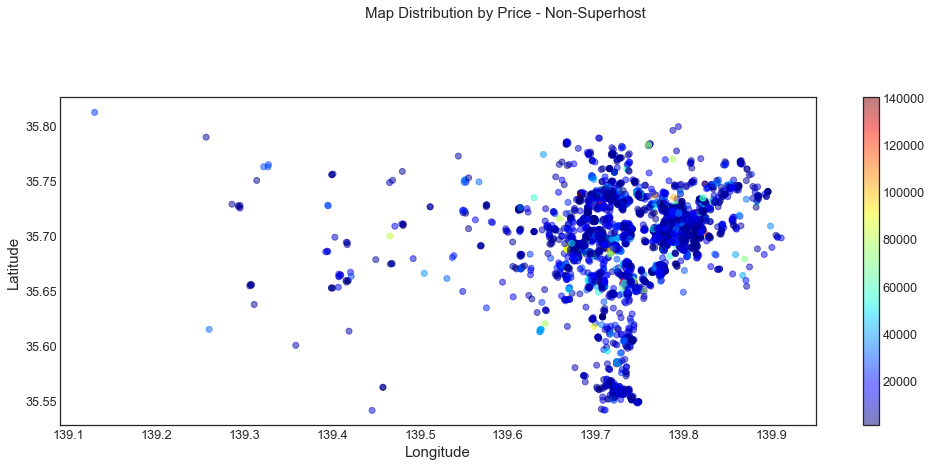

In [18]:
# Price Heatmap - Non-Superhost (excluding outliers)

nonsuperhost_no_outliers = (
    lr_select[(lr_select.host_is_superhost == 'Non-Superhost') &
              (lr_select.price <= price_mean + 3 * price_std)]
)

plt.style.use('seaborn-white')
plt.figure(figsize=(15, 7))
plt.scatter(x=nonsuperhost_no_outliers['longitude'],
            y=nonsuperhost_no_outliers['latitude'],
            c=nonsuperhost_no_outliers['price'],
            cmap=plt.get_cmap('jet'),
            alpha=0.5)
plt.colorbar()
plt.suptitle("Map Distribution by Price - Non-Superhost", fontsize=15)
plt.xlabel("Longitude", fontsize=15)
plt.ylabel("Latitude", fontsize=15)
plt.tick_params(bottom=True, labelbottom=True)
plt.tight_layout(pad=3)
plt.show()

* The map is dominated by dark blue dots, reinforcing the earlier observation from the distribution plots that prices are heavily skewed.
* The area or district does seem to have any effect on price since there are no concentrated specs of lighter or hotter colors.
* Listings on the sparser side of the map seem to have higher prices relative to those on the more dense areas, where there is more competition and options.
* On the surface, the lighter specs appear to be spread out randomly throughout Tokyo.

### **6.4 Ratings Distributions**

**How do Airbnb ratings work?**

On top of written reviews, guests can also evaluate their whole experience by giving star ratings, ranging from 0 to 5. These are then aggregated and summarized by Airbnb to be available to the hosts, and even get posted on their listing profiles.

These are the categories, and things that guests need to keep in mind as they give ratings:
* <i><b>Overall Experience</b></i>
    - How was it?
* <i><b>Accuracy</b></i>
    - Are the posted details, photos, and information accurate and up to date?
* <i><b>Cleanliness</b></i>
    - Did the listing meet Airbnb's cleanliness standards?
* <i><b>Check-in</b></i>
    - Was it easy and seamless?
* <i><b>Communication</b></i>
    - Did the host respond to guest queries promptly?
* <i><b>Location</b></i>
    - Was the guest made aware of safety, transportation, points of interest and special considerations like
    noise or other situations that might affect their stay?
* <i><b>Value</b></i>
    - Was it worth the price?
    
**Ratings Validation and Counter-Check Measures**
    
According to Airbnb's website, they have launched a tool that validates and detects outlier reviews or one-off bad reviews, as response to feedback from hosts. A sample scenario would be high scores across categories, but a 2-star rating on Overall Experience. When this happens, the guest receives a notification and enables them to revisit and change their review ratings.

The same step is done with Location and Value ratings, which happens when guests rate a listing with less than 3 stars. The guest will receive a notification to further probe the reason for the low rating by asking the following questions, respectively:
* Was the listing not described accurately?
* What would have made this listing a better value?
    
Airbnb took these extra steps, especially for Location, since hosts raised issues on being penalized on a rating aspect that is out of their control.

<font size="3"><b>Table 6. Mean Ratings Per Category</b></font>

In [19]:
scores_df = lr_select[['host_is_superhost',
                       'review_scores_rating',
                       'review_scores_accuracy',
                       'review_scores_cleanliness',
                       'review_scores_checkin',
                       'review_scores_communication',
                       'review_scores_location',
                       'review_scores_value']]

scores_summary = scores_df.groupby('host_is_superhost').mean().reset_index()
scores_summary = scores_summary.T.iloc[1:,
                                        :].rename(columns={0: 'Non-Superhost',
                                                              1: 'Superhost'})
display(scores_summary)

,Non-Superhost,Superhost
review_scores_rating,4.591185,4.821601
review_scores_accuracy,4.686419,4.853421
review_scores_cleanliness,4.587402,4.818279
review_scores_checkin,4.764488,4.878319
review_scores_communication,4.750956,4.891968
review_scores_location,4.664841,4.748188
review_scores_value,4.603768,4.735569


Across the board, Superhosts have higher ratings than non-Superhosts. This stands to reason, since sufficiently high ratings is a requirement for a host to achieve and maintain their Superhost status (having a Superhost status requires at least a 4.8 Overall Experience Rating). Although aside from simply looking at the numbers, it would be good to have a sense of the distributions of the ratings for both overall experience and the individual review criteria, to see how Superhosts and non-Superhosts compare.

**Figure 8. Violin Plots of Overall Experience Scores**

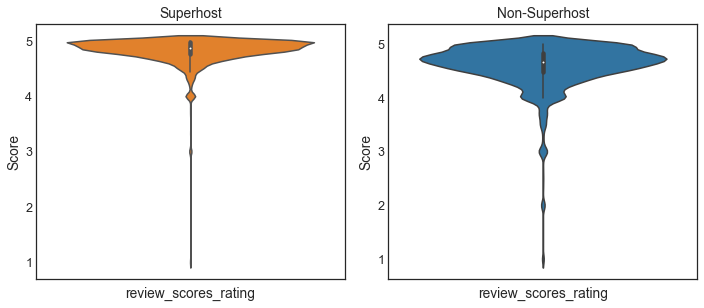

In [20]:
superhost_scores = scores_df[scores_df['host_is_superhost'] == 'Superhost']
nonsuperhost_scores = scores_df[scores_df['host_is_superhost'] ==
                                'Non-Superhost']

fig, ax = plt.subplots(1, 2, figsize=(10, 4.5))
sns.violinplot(y=superhost_scores['review_scores_rating'], color='tab:orange',
               ax=ax[0], label='Superhost')
ax[0].set_xlabel('review_scores_rating')
ax[0].set_title('Superhost')
ax[0].set_ylabel('Score')
# ax[0].legend(title='Superhost', loc='lower right')

sns.violinplot(y=nonsuperhost_scores['review_scores_rating'], ax=ax[1],
               label='Non-Superhost')
ax[1].set_xlabel('review_scores_rating')
ax[1].set_title('Non-Superhost')
ax[1].set_ylabel('Score')
# ax[1].legend(title='Non-Superhost', loc='lower right')

plt.tight_layout()
plt.show()

**Figure 9. Violin Plots of Review Criteria Scores for Superhosts**

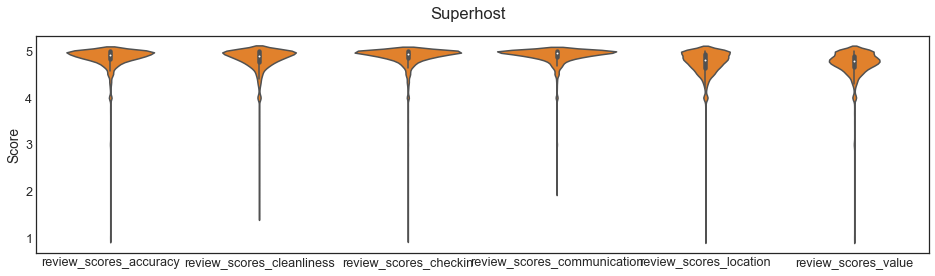

In [21]:
fig, ax = plt.subplots(figsize=(16, 4))
sns.violinplot(data=superhost_scores.iloc[:, 2:], color='tab:orange')
ax.set_ylabel('Score')
fig.suptitle('Superhost')
plt.show()

**Figure 10. Violin Plots of Review Criteria Scores for Non-Superhosts**

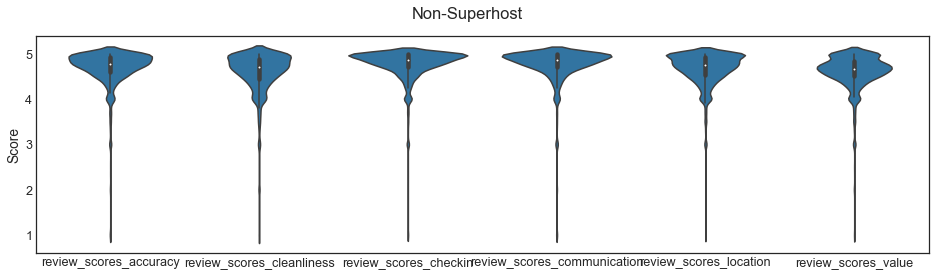

In [22]:
fig, ax = plt.subplots(figsize=(16, 4))
sns.violinplot(data=nonsuperhost_scores.iloc[:, 2:], color='tab:blue')
ax.set_ylabel('Score')
fig.suptitle('Non-Superhost')
plt.show()

From the above violin plots, it can be seen that the distributions across the different review criteria vary. The distributions of check-in and communication seem to be much narrower compared to those for cleanliness, location, and value, which show higher dispersion. Also, the overall scores for Superhosts appears to have a much narrower distribution than for non-Superhosts. We examine this further in the subsequent frequency plots.

**Figure 11. Histogram and KDE Plot of Superhost Overall Experience Scores**

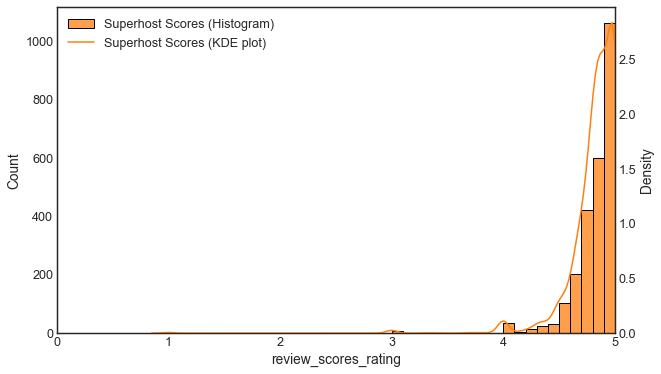

In [23]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=superhost_scores['review_scores_rating'], bins=40,
             ax=ax1, color='tab:orange',
             label='Superhost Scores (Histogram)')
ax1.set_xlabel('review_scores_rating')
ax2 = ax1.twinx()
sns.kdeplot(x=superhost_scores['review_scores_rating'], ax=ax2,
            label='Superhost Scores (KDE plot)',
            color='tab:orange')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0, 5)
plt.show()

**Figure 12. Histogram and KDE Plot of Non-Superhost Overall Experience Scores**

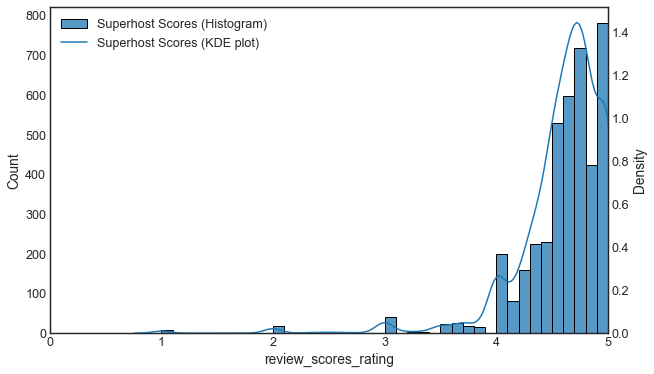

In [24]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=nonsuperhost_scores['review_scores_rating'], bins=40,
             ax=ax1, color='tab:blue',
             label='Superhost Scores (Histogram)')
ax1.set_xlabel('review_scores_rating')
ax2 = ax1.twinx()
sns.kdeplot(x=nonsuperhost_scores['review_scores_rating'], ax=ax2,
            label='Superhost Scores (KDE plot)',
            color='tab:blue')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.xlim(0, 5)
plt.show()

**How do Superhost and Non-Superhost listings compare on ratings?**

For overall ratings scores, the histograms reinforce the impression that although similarly distributed, listings managed by Superhosts do perform better than those of Non-Superhosts. However, one might not be able to gauge if there is significant difference between the scores. How different is as 4.5 versus a 4.8? In answering this question, one has to consider that the distributions do not conform to any of the more familiar distribution, hence non-parametric tests may need to be applied. This shall be explored further in the succeeding sections.

### **6.5 Correlations of Features**

It would be interesting to see how these features behave with each other linearly, so correlation heat maps were produced. The heuristic below will serve as a guide as these linear relationships are examined and interpreted.

<br></br>
<center><font size="3"><b>Table 7. Correlation Coefficient Interpretation</b></font></center>

|Correlation Coefficient|Interpretation of Linear Relationship|
|:---|:---|
|r = -1|Perfect negative|
|-1 < r <= -0.7|Strong negative|
|-0.7 < r <= -0.3|Moderate negative|
| -0.3 < r < 0|Weak negative|
|r = 0|No relationship|
|0 < r <  0.3|Weak positive|
|0.3 <= r < 0.7|Moderate positive|
|0.7 <= r < 1|Strong positive|
|r = 1|Perfect positive|

In [25]:
# Selected fields for correlation analysis
fields_corr = ['hrr',
               'host_listings_count',
               'latitude',
               'longitude',
               'accommodates',
               'bathrooms',
               'bedrooms',
               'beds',
               'amenities_ct',
               'days_as_host',
               'price',
               'minimum_nights',
               'availability_365',
               'review_scores_rating',
               'review_scores_accuracy',
               'review_scores_cleanliness',
               'review_scores_checkin',
               'review_scores_communication',
               'review_scores_location',
               'review_scores_value',
               'number_of_reviews']

<font size="3"><b>Figure 13. Correlation Heat Map - Non-Superhost</b>

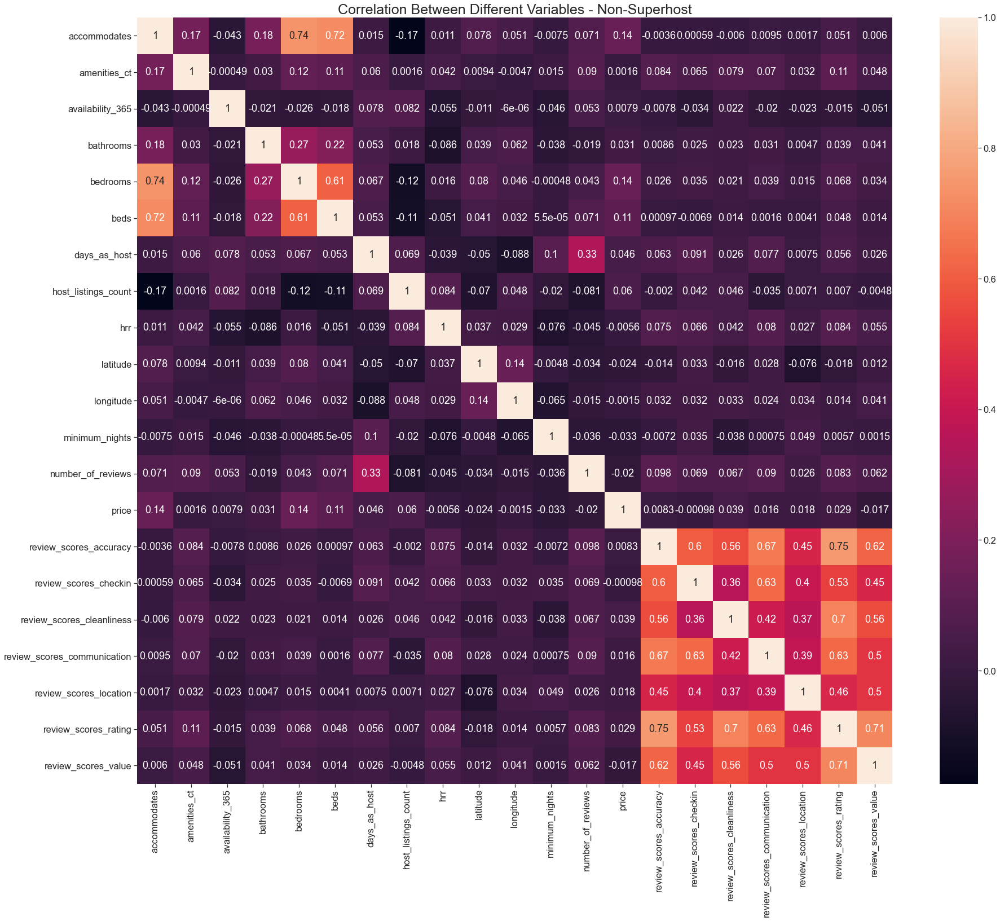

In [26]:
# Correlation heatmap - Non-Superhost
corr_data = lr_select[lr_select.host_is_superhost == 'Non-Superhost']
sns.set_context('notebook', font_scale=1.5)
corr = corr_data[sorted(fields_corr)].corr()
plt.figure(figsize=(30, 25))
plt.title("Correlation Between Different Variables - Non-Superhost",
          fontsize=25)
sns.heatmap(corr, annot=True)
plt.show()

An initial glance would draw one's attention to the review scores, having the hotter colors. Though they measure different facets of a guest's stay, it is quite expected of them to be positively correlated, as discussed in the previous section.


**Review Scores**
* The scores show moderate to strong positive linear relationships with each other.
* The strongest positive linear relationship between review scores can be seen between `review_scores_rating` and `review_scores_accuracy`. While the weakest can be seen between `review_scores_cleanliness` and `review_scores_checkin`.
* As discussed in the previous section, it is not surprising to see that among all review scores, the `review_scores_rating` has the weakest linear relationship with `review_scores_location`. This is where hosts usually have issues with reviews.



**Notable Correlations**
* <i>"Capacity"</i> features such as, `accommodates`, `bedrooms`, and `beds` have moderate to strong positive linear relationships with each other.
* Number of reviews tends to increase over time. Though true for above, the relationship between `number_of_reviews` and `days_as_host` is weak.

<font size="3"><b>Figure 14. Correlation Heat Map - Superhost</b>

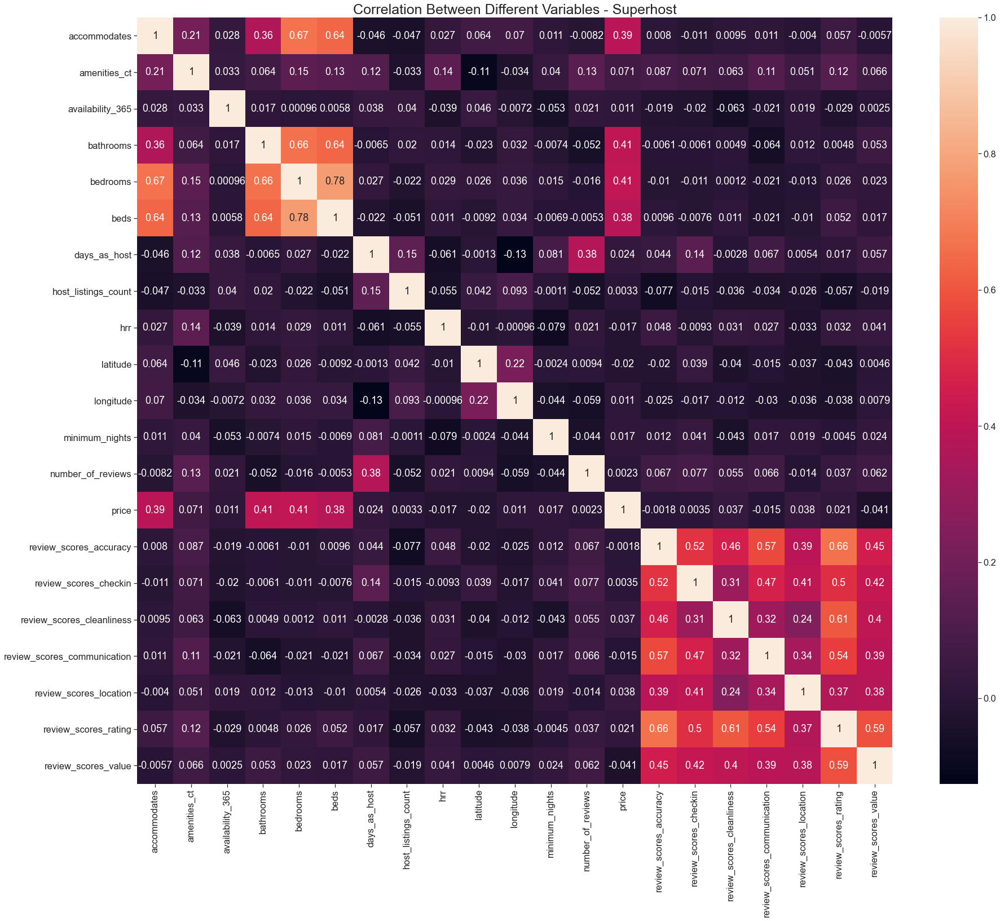

In [27]:
# Correlation Heatmap - Superhost
corr_data = lr_select[lr_select.host_is_superhost == 'Superhost']
sns.set_context('notebook', font_scale=1.5)
corr = corr_data[sorted(fields_corr)].corr()
plt.figure(figsize=(30, 25))
plt.title("Correlation Between Different Variables - Superhost",
          fontsize=25)
sns.heatmap(corr, annot=True)
plt.show()

Similar to Non-Superhosts, all review scores show positive linear relationship with each other. However, the relationships appear to be weaker. This goes against the thinking that since Superhost listings are expected to maintain higher ratings, then review score relationships should be stronger. This may be worth investigating further, but already beyond the scope of this study.

The linear relationship of `accommodates` to `beds` and `bedrooms` seem to be weaker for Superhosts, but positive correlations between `bed` and `bedrooms` have become stronger. Superhosts might have less beds per bedroom in their listings or that more of these listings follow a one-bed-one-bedroom set-up. `bathrooms` also showed a much stronger relationship with `bedrooms` and `beds`.

Another notable difference would be the relationship of `price` with `bathrooms`, `beds`, and `bedrooms` that has become stronger for Superhost listings.

## **7.0 Hypothesis Testing**

Combing through the data, one might ask: Do Superhosts tend to manage different types of property compared to Non-Superhosts? Is there a price difference between their listings; i.e. are Superhost listings priced relatively more expensive than those of Non-Superhosts, or vice versa? On customer reviews, which group has higher ratings? These may be answered by doing hypothesis testing.

### **7.1 Tests of Independence**

To test for independence between a host being tagged as a Superhost or non-Superhost, the Chi-Squared Test for Independence is applied, using the following hypotheses:

<br>
<center>$H_0$: Host Type and Room Type are independent</center>
<center>$H_1$: Host Type and Room Type are not independent</center>
<br>

A significance level of $\alpha = 0.01$ is also applied for this and other subsequent hypothesis tests.

To proceed with the Chi-Squared test, the contingency table of observed frequencies is compared against the table of expected values, assuming independence.

<font size="3"><b>Table 8. Observed Count per Host Type and Room Type</b>

In [28]:
observed = lr_select.groupby(['host_is_superhost',
                              'room_type'])['room_type'].count().unstack()
display(observed)

room_type,Entire home/apt,Hotel room,Private room,Shared room
host_is_superhost,,,,
Non-Superhost,2988,104,877,142
Superhost,1908,41,506,50


<font size="3"><b>Table 9. Expected Count per Host Type and Room Type, Assuming Independence</b>

In [29]:
expected = observed.copy()
for col in observed.columns:
    for row in observed.index:
        expected.loc[row, col] = (observed.loc[row].sum() *
                                  observed.loc[:, col].sum() /
                                  np.array(observed).sum())
display(expected)

room_type,Entire home/apt,Hotel room,Private room,Shared room
host_is_superhost,,,,
Non-Superhost,3042.23942,90.099002,859.358071,119.303507
Superhost,1853.76058,54.900998,523.641929,72.696493


Comparing the tables, it is seen that Non-Superhosts manage more `Entire home/apt`, whereas Superhosts manage more `Hotel room`, `Private room`, and `Shared room` than expected compared to if the variables were independent.

To determine if the differences between observed and expected values are significant, the Chi-Squared statistic is computed and the p-value is determined.

In [30]:
Q = np.array((observed - expected)**2 / expected).sum()
df = (observed.shape[0] - 1)*(observed.shape[1] - 1)
p_value = 1 - chi2.cdf(Q, df)

print('Chi-Squared Statistic:', Q)
print('p-value:', p_value)

Chi-Squared Statistic: 20.578907735508796
p-value: 0.0001287486746923694


Thus, for a significance level of $\alpha = 0.01$, the null hypothesis that Host Type and Room Type are independent is rejected. While the Chi-Squared test does not specify which specific dependencies between host and room type categories are significant, we conclude that either Superhosts are more likely to manage entire homes and apartments, or non-Superhosts are more likely to utilize at least one of the other property types for their Airbnb listings.

### **7.2 Tests of Normality**

As previously mentioned, the prices and rating of Superhosts and non-Superhosts will be explored, and whether or not these are significant will be checked.  First however, an exploration of the distributions of these features will be done, to see if they are normally distributed, or if they conform to some other distribution, before proceeding to directly comparing the two groups.

Recall the distribution plots constructed earlier, showing for now only the kernel density estimates without binning the frequency counts.

<font size="3"><b>Figure 15. KDE Plots of Price and Overall Experience Review Score</b>

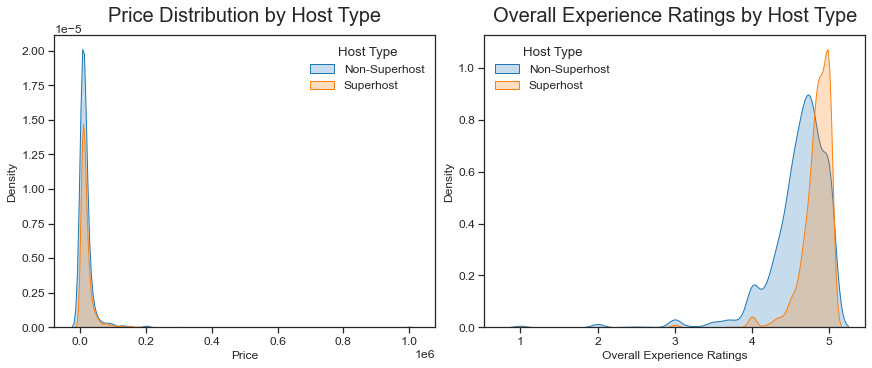

In [31]:
plt.style.use('seaborn-white')
sns.set_context('notebook', font_scale=1.1)
fig = plt.figure(constrained_layout=True, figsize=(12, 5))
gs = fig.add_gridspec(1, 2)
ax0 = fig.add_subplot(gs[:, :1])
ax1 = fig.add_subplot(gs[:, 1:])

# KDE Plot of Price by Host Type
sns.kdeplot(data=lr_select,
            x='price',
            hue='host_is_superhost',
            fill=True,
            legend=False,
            ax=ax0,
            palette=["C1", "C0"])
ax0.legend(title='Host Type',
           labels=['Non-Superhost', 'Superhost'],
           loc='upper right',
           fontsize=12)
ax0.set_title('Price Distribution by Host Type', fontsize=20, y=1.025)
ax0.set_xlabel('Price', fontsize=12)
ax0.set_ylabel('Density', fontsize=12)

# KDE Plot of Overall Experience Rating by Host Type
sns.kdeplot(data=lr_select,
            x='review_scores_rating',
            hue='host_is_superhost',
            fill=True,
            legend=False,
            ax=ax1,
            palette=["C1", "C0"])
ax1.legend(title='Host Type',
           labels=['Non-Superhost', 'Superhost'],
           loc='upper left',
           fontsize=12)
ax1.set_title('Overall Experience Ratings by Host Type', fontsize=20, y=1.025)
ax1.set_xlabel('Overall Experience Ratings', fontsize=12)
ax1.set_ylabel('Density', fontsize=12)
plt.show()

The KDE graphs show that `price` and `review_scores_rating` are highly asymmetric, for both host types. Although visual inspection indicates that they are not normal, for added rigor, tests will be applied to check if they are normally distributed, to provide guidance on what test(s) to implement when comparing the distributions.

Normality tests are used to determine if the sample data has been drawn from a normally-distributed population. In this study, three general normality tests were used, namely:

* Anderson-Darling - a modification of the Kolmogorov-Smirnov (K-S) test and gives more weight to the tails than does the K-S test.
* Shapiro-Wilk - small values of this statistic are evidence of departure from normality.
* D'Agostino's $K^2$ - dubbed as an omnibus test for normality that uses Skewness and Kurtosis.

Both Anderson-Darling and Shapiro-Wilk are affected by ties, but D'Agostino's $K^2$ is not. In the succeeding section, the following hypotheses that `price`, and `review_scores_rating` for Superhosts and Non-Superhosts are normally-distributed will be tested, again at the 99% confidence level ($\alpha$= 0.01):  
<br>
<center>$H_0$: The data follows a Normal Distribution</center>
<center>$H_1$: The data does not follow a Normal Distribution</center>

In [32]:
# Hypothesis testing for price and review scores
a = lr_select[lr_select.host_is_superhost == 'Superhost']['price']
b = lr_select[lr_select.host_is_superhost == 'Non-Superhost']['price']
c = (lr_select[lr_select.host_is_superhost == 'Superhost']
     ['review_scores_rating'])
d = (lr_select[lr_select.host_is_superhost == 'Non-Superhost']
     ['review_scores_rating'])

In [33]:
# Normality Testing
def normality(data, alpha=1):
    """Return a pandas.DataFrame of normality test results.

    Applies the following nomality tests:
        1. Shapiro-Wilk
        2. D'Agostino's K^2
        3. Anderson-Darling

    Parameters
    ----------
    data : pandas.DataFrame
        Data set to be tested

    alpha : int or float
        Level of significance in %

    Returns
    -------
    test_table : pandas.DataFrame
        Data frame containing test results
    """

    test_table = pd.DataFrame()
    tests = [shapiro, normaltest, anderson]
    names = ["Shapiro-Wilk", "D’Agostino’s K^2", "Anderson-Darling"]
    for i, t in enumerate(tests):
        test = names[i]
        if i < 2:
            stat, pvalue = t(data)
            critical = "N/A"
            if pvalue < alpha:
                decision = "Reject H0"
            else:
                decision = "Do Not Reject H0"
        else:
            ad = t(data)
            stat = ad.statistic
            pvalue = "N/A"
            try:
                critical = ad.critical_values[ad.significance_level.
                                              tolist().index(alpha)]
            except ValueError:
                critical = "N/A"

            if critical == "N/A":
                decision = "Invalid Alpha"
            elif stat > critical:
                decision = "Reject H0"
            else:
                decision = "Do Not Reject H0"

        test_table = pd.concat([test_table,
                                pd.DataFrame(
                                   {'Statistic': stat,
                                    'P-Value': pvalue,
                                    'Critical Value': critical,
                                    'Decision': decision},
                                   index=[names[i]])],
                               axis=0)
    return test_table

<font size="3"><b>Table 10. Test of Normality Results</b></font>

In [34]:
# For Price
print("1. PRICE - Superhost")
display(normality(a))
print("2. PRICE - Non-Superhost")
display(normality(b))

# For Overall Ratings
print("3. OVERALL EXPERIENCE RATINGS - Superhost")
display(normality(c))
print("4. OVERALL EXPERIENCE RATINGS - Non-Superhost")
display(normality(d))

1. PRICE - Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.436399,0.0,N/A,Reject H0
D’Agostino’s K^2,3416.568148,0.0,N/A,Reject H0
Anderson-Darling,363.080013,N/A,1.09,Reject H0


2. PRICE - Non-Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.209090,0.0,N/A,Reject H0
D’Agostino’s K^2,8053.241528,0.0,N/A,Reject H0
Anderson-Darling,903.442370,N/A,1.091,Reject H0


3. OVERALL EXPERIENCE RATINGS - Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.622831,0.0,N/A,Reject H0
D’Agostino’s K^2,2854.630234,0.0,N/A,Reject H0
Anderson-Darling,165.722508,N/A,1.09,Reject H0


4. OVERALL EXPERIENCE RATINGS - Non-Superhost


,Statistic,P-Value,Critical Value,Decision
Shapiro-Wilk,0.745486,0.0,N/A,Reject H0
D’Agostino’s K^2,2904.493101,0.0,N/A,Reject H0
Anderson-Darling,182.154382,N/A,1.091,Reject H0


The `p-values` from the Shapiro-Wilk and D'Agostino's $K^2$ tests are all well below 0.01 (approaching zero, in fact) and the Anderson-Darling test statistic is higher than the critical value at 99% confidence level. Hence **$H_0$ is rejected for these tests, suggesting that prices and overall experience ratings of Superhost and Non-Superhost listings are not normally-distributed**. This will serve as guidance on whether assumptions for any subsequent parameteric tests, specifically the `t-test`, are met, when comparing for significant differences in mean `price` and `review_scores_rating` between the host types.

### **7.3 Goodness-of-Fit Tests**

Having determined that the price and rating scores are not normally distributed, it would be interesting to take it a step further by checking if they conform to any of the commonly used continuous distributions, aside from the normal distribution. For this, the **Kolmogorov-Smirnov (K-S) Goodness-of-Fit test** is applied against various distributions, testing the following hypothesis at the 99% confidence level:
<br>
<center>$H_0$: The data follows the given distribution</center>
<center>$H_1$: The data does not follow the given distribution</center>

For the purpose of this study, the following distributions are considered:
- Gamma
- Exponential
- Exponentiated Weibull
- Weibull Maximum Extreme Value
- Wiebull Minimum Extreme Value
- Power Law

In [35]:
def get_best_distribution(data):
    dist_names = ["gamma", "expon", "exponweib", "weibull_min",
                  "weibull_max", "powerlaw"]
    dist_results = []
    params = {}
    for dist_name in dist_names:
        dist = getattr(st, dist_name)
        param = dist.fit(data)

        params[dist_name] = param
        # Applying the Kolmogorov-Smirnov test
        D, p = st.kstest(data, dist_name, args=param)
        print("p value for " + dist_name + " = " + str(p))
        dist_results.append((dist_name, p))

    # select the best fitted distribution
    best_dist, best_p = (max(dist_results, key=lambda item: item[1]))
    # store the name of the best fit and its p value

    print("\nBest fitting distribution: "+str(best_dist))
    print("Best p value: " + str(best_p))
    print("Parameters for the best fit: " + str(params[best_dist]))

    return best_dist, best_p, params[best_dist]

**Table 11. Goodness-of-Fit Test Results for Superhost Price Distribution**

In [36]:
price_dist_superhost = get_best_distribution(superhost_price)

p value for gamma = 2.129031395380903e-60
p value for expon = 4.102092837741472e-19
p value for exponweib = 0.0446132462634522
p value for weibull_min = 2.7684070307765335e-15
p value for weibull_max = 0.0
p value for powerlaw = 8.594879435814925e-218

Best fitting distribution: exponweib
Best p value: 0.0446132462634522
Parameters for the best fit: (53.54441760949399, 0.2937373551195599, 689.0644503434182, 64.43431078071012)


**Table 12. Goodness-of-Fit Test Results for non-Superhost Price Distribution**

In [37]:
price_dist_nonsuperhost = get_best_distribution(nonsuperhost_price)

p value for gamma = 1.3706823620123867e-170
p value for expon = 2.31087297947984e-28
p value for exponweib = 0.11358211322411726
p value for weibull_min = 1.3767734455626659e-22
p value for weibull_max = 0.0
p value for powerlaw = 0.0

Best fitting distribution: exponweib
Best p value: 0.11358211322411726
Parameters for the best fit: (43.15891145527668, 0.2891188914156714, 640.3972192482961, 54.88088313322537)


The resulting p-values show that there is insufficient evidence to reject the null hypothesis that the distributions follow the the Exponentiated Weibull distribution, for both Superhosts and Non-Superhosts, at a significance level of $\alpha$ = 0.01.

The best-fit Exponentiated Weibull distributions are thus plotted against the respective histograms, to visually verify whether these findings are correct. It should be noted that the two Exponentiated Weibull distributions for Superhosts and non-Superhosts have different parameters, and thus cannot be said to have the same shape, even if their distributions are similar.

**Figure 16. Best Fit for the Superhost Price Distribution**

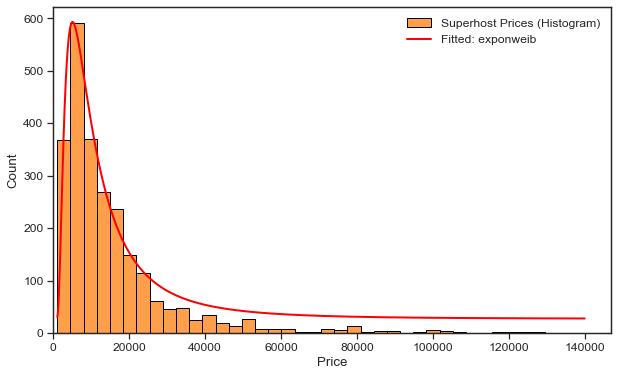

In [38]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=superhost_price, bins=40, ax=ax1,
             color='tab:orange', label='Superhost Prices (Histogram)')
ax1.set_xlabel('Price')
ax2 = ax1.twinx()
x = np.linspace(superhost_price.min(), superhost_price.max(), 1000)
fitted = exponweib.pdf(x, price_dist_superhost[2][0],
                       price_dist_superhost[2][1],
                       price_dist_superhost[2][2],
                       price_dist_superhost[2][3])
ax2.plot(x, fitted, 'r-', linewidth=2.0,
         label=f'Fitted: {price_dist_superhost[0]}')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.tick_params(right=False, labelright=False, top=False, labeltop=False)
plt.xlim(0,)
plt.show()

**Figure 17. Best Fit for the Non-Superhost Price Distribution**

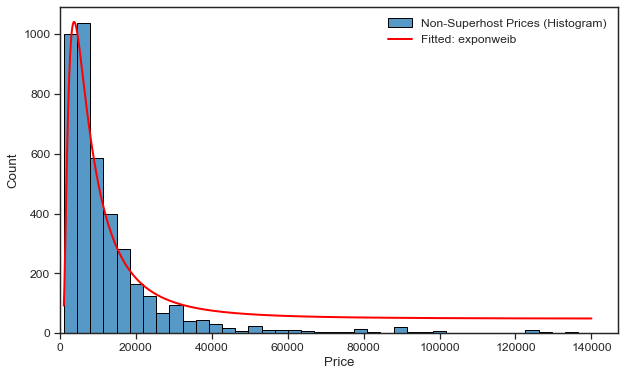

In [39]:
fig, ax1 = plt.subplots(figsize=(10, 6))
sns.histplot(x=nonsuperhost_price, bins=40, ax=ax1,
             label='Non-Superhost Prices (Histogram)')
ax1.set_xlabel('Price')

ax2 = ax1.twinx()
x = np.linspace(nonsuperhost_price.min(), nonsuperhost_price.max(), 1000)
fitted = exponweib.pdf(x, price_dist_nonsuperhost[2][0],
                       price_dist_nonsuperhost[2][1],
                       price_dist_nonsuperhost[2][2],
                       price_dist_nonsuperhost[2][3])
ax2.plot(x, fitted, 'r-', linewidth=2.0,
         label=f'Fitted: {price_dist_nonsuperhost[0]}')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.tick_params(right=False, labelright=False, top=False, labeltop=False)
plt.xlim(0,)
plt.show()

The plots show that the best-fitting Exponentiated Weibull distributions are indeed a good fit for the price distributions of both Superhosts and non-Superhosts.

For overall rating scores of Superhosts and non-Superhosts, the same analysis is applied, again using the Komlogorov-Smirnov Goodness-of-Fit Test.

**Table 13. Goodness-of-Fit Test Results for Superhost Overall Rating Distribution**

In [40]:
best_score_dist = get_best_distribution(superhost_scores['review_scores_rating'])

p value for gamma = 0.0
p value for expon = 0.0
p value for exponweib = 2.4103221105131837e-61
p value for weibull_min = 2.7180766456935214e-39
p value for weibull_max = 7.878757563683171e-131
p value for powerlaw = 5.67611092013089e-156

Best fitting distribution: weibull_min
Best p value: 2.7180766456935214e-39
Parameters for the best fit: (251178191.09238374, -30527231.815250218, 30527236.71891638)


**Table 14. Goodness-of-Fit Test Results for Non-Superhost Overall Rating Distribution**

In [41]:
best_price_dist = get_best_distribution(nonsuperhost_scores['review_scores_rating'])

p value for gamma = 6.899975313511211e-138
p value for expon = 0.0
p value for exponweib = 2.583816557601536e-168
p value for weibull_min = 1.0677279407492004e-94
p value for weibull_max = 2.3699563317641362e-91
p value for powerlaw = 2.3699563317244436e-91

Best fitting distribution: weibull_max
Best p value: 2.3699563317641362e-91
Parameters for the best fit: (0.9680741200826084, 5.000000000000001, 0.4107732857048751)


Considering the very-low p-values obtained, none of the distributions tested appear to be a good fit to the data on overall rating scores, for both Superhosts and non-Superhosts.

### **7.4 Tests Comparing Two Distributions/Means (Mann-Whitney U test and Welch's *t*-test)**

The **Mann-Whitney U** test is a non-parametric test used to compare differences between two categorical, independent groups when the dependent variable is either ordinal or continuous, but not normally distributed.

For this study's dependent variables, `price` is continuous and `review_scores_rating` is ordinal. The independent variable (Superhost or Non-Superhost) is categorical in nature, and Superhost listings and non-Superhost listings comprise non-paired and separate populations (a listing's host cannot be both a Superhost and non-Superhost), denoting independence between the observations. Finally, the normality and goodness-of-fit tests prove that the dependent variables have non-normal distributions. Therefore, this non-parametric test is suitable for comparing prices and overall ratings distributions of Superhosts and non-Superhosts.

That said, the Mann-Whitney U test is <u>not</u> strictly a test of location (unless under certain specific conditions involving identically shaped distributions, which we have not established). Specifically, it tests whether, for randomly selected values *x* and *y* from two populations, the probability of *x* being greater than *y* is equal to the probability of *y* being greater than *x*. Alternatively, the hypotheses may be stated as follows (for a one-tailed test where the variable $x$ is assigned to the Superhost listings, and $y$ to Non-Superhost listings):

<center>$H_0$: The distribution underlying $x$ is stochastically less than or equal to that of $y$</center>
<center>$H_1$: The distribution underlying $x$ is stochastically greater than that of $y$</center>

  <font size="3"><b>Table 15. Mann-Whitney U Test Results</b></font>

In [42]:
# Non-Parametric Hypothesis Testing of Price Distribution
# To test if price distribution of Superhost <= Non-Superhost
print("Mann-Whitney U Test p-value (price) =",
      mannwhitneyu(a, b, alternative='greater').pvalue)

# To test if OER distribution of Superhost <= Non-Superhost
print("Mann-Whitney U Test p-value (overall experience rating) =",
      mannwhitneyu(c, d, alternative='greater').pvalue)

Mann-Whitney U Test p-value (price) = 1.7145250634222524e-27
Mann-Whitney U Test p-value (overall experience rating) = 3.455169664020553e-199


Given that the resulting `p-values` after running the test to compare `price` and `review_scores_rating` between host types are less than $\alpha$, **there is sufficient evidence to reject the null hypotheses that prices and overall experience for Superhosts are stochastically less than or equal to those for non-Superhosts**.

That said, these findings are not very straightforward, as the concept of a distribution being "stochastically less than" another is not fully intuitive. If the objective were to simply compare the mean price and overall ratings of listings managed by Superhosts vs non-Superhosts, another test that may be considered is **Welch's *t*-test**, or the test comparing means of two populations with unknown and unequal variances. This is otherwise simply termed as the "unequal variances *t*-test (although it is also known by other names, such as the Aspin-Welch test), a popular and well-known test often used for this very purpose under consideration in this study. It tests the following hypothesis:

<center>$H_0$: The mean of $x$ is less than or equal to that of $y$</center>
<center>$H_1$: The mean of $x$ is greater than that of $y$</center>

Technically, Welch's *t*-test is a parametric test which assumes normality, an assumption we have been careful to test in preceding sections, and have in fact established as unmet. That said, the following are known about the t-test:
- despite the normality assumption, it is insensitive to deviations from normality when sample sizes are large (n > 100 is generally considered as sufficient, and the samples under consideration for this study are easily well beyond that)
- it is more powerful than the Mann-Whitney U test, even when the Mann-Whitney U test meets the requirements to function as a test of location
- it also has better Type I error control compared to the Mann-Whitney U test when data is heteroscedastic and non-normal

Given these considerations, we attempt Welch's *t*-test as well on the same datasets for price and overall ratings of Superhosts vs non-Superhosts.


  <font size="3"><b>Table 16. Welch's Unequal Variances *t*-test Results</b></font>

In [43]:
# Parametric Hypothesis Testing of Price Distribution
# To test if mean price for Superhost <= Non-Superhost
print("Welch's t-test p-value (price) =",
      stats.ttest_ind(a, b, equal_var=False).pvalue)
print("Welch's t-test p-value (overall experience rating) =",
      stats.ttest_ind(c, d, equal_var=False).pvalue)


Welch's t-test p-value (price) = 0.11789172331833506
Welch's t-test p-value (overall experience rating) = 5.752888176422702e-166


Interestingly, at a 99% confidence level, **we fail to reject the null hypotheses that the mean prices of Superhost listings are equal to or less than those for non-Superhost listings.** In other words, it appears that listings regardless of host type may be similarly priced, in contrast to what was initially suggested by the Mann-Whitney U test.

On the other hand, **we do reject the null hypotheses that the mean overall rating score of Superhost listings are equal to or less than those for non-Superhost listings**, matching our expectation that Superhosts tend to receive better review scores.

## **8.0 Resampling**

### **8.1 Use of Bootstrapping to Determine the Sampling Distribution of Means**

Given the results found upon using hypothesis tests to compare prices, which resulted in somewhat incongruous results between the non-parametric and parametric tests, it would be useful to attempt other methods to better understand the sampling distribution of the mean price of Superhost listings versus non-Superhost listings. For completeness' sake, the sampling distribution can be derived for mean overall experience scores as well.

Given that there has been sufficient evidence to say that price and overall experience scores are not normally distributed for both host types, we can obtain the sampling distributions by resampling via bootstrapping, to make inferences on the means of these features. Further, we can create confidence intervals on the differences of the bootstrapped means based on their percentiles.

Upon performing bootstrapping on price and overall experience scores for the two host types, the frequency of the resulting means were plotted on histograms along with their corresponding 99% confidence intervals as derived from the percentiles. Quantile-Quantile or QQ plots were used to verify if the distribution of the differences of means is normal, as expected based on the Central Limit theorem, which tells us that sampling distribution of means randomly drawn from a population will be normally distributed. This is confirmed if the data points follow the quantile plot of the standard normal distribution, which is the red line sloping at around 45 degrees.


In [44]:
# Bootstrapping
def plot_hist(x, bins, p=5, color='tab:blue'):
    """Plot histogram of bootstrapped data.

    Parameters
    ----------
    x : array-like
        Data points to plot
    bins : int
        Number of bins for the plot
    p : float
        Alpha * 100 for confidence interval
    color : str
        Color of histogram bars
    """

    # Plot the distribution and mark the mean
    plt.hist(x, alpha=.5, bins=25, color=color)
    plt.axvline(x.mean(), color='darkgreen')
    # 95% confidence interval
    plt.axvline(np.percentile(x, p/2.), color='r', linewidth=3)
    plt.axvline(np.percentile(x, 100-p/2.), color='r', linewidth=3)


def plot_dists(a, b, a_label='pop_A', b_label='pop_B', p=5):
    """Side-by-Side plotting of Bootstrapped Data.

    Parameters
    ----------
    a : array-like
        Feature for comparison from stratum a
    b : array-like
        Feature for comparison from stratum b
    a_label : str
        Label for stratum a
    b_label : str
        Label for stratum b
    p : int
        Alpha * 100 for confidence interval
    """

    # Create a single sequence of bins to be shared across both
    # distribution plots for visualization consistency.
    combined = pd.concat([a, b])
    breaks = len(np.linspace(combined.min(), combined.max()))

    f = plt.figure(figsize=(12, 4))
    ax1 = f.add_subplot(1, 2, 1)
    ax1 = plot_hist(a, breaks, p, color='tab:orange')
    plt.title(a_label)

    ax2 = f.add_subplot(1, 2, 2)
    ax2 = plot_hist(b, breaks, p, color='tab:blue')
    plt.title(b_label)

    plt.tight_layout()
    plt.show()


def bootstrap_meandiff(a, b, n=100, labels=['A', 'B'], p=5):
    """Run bootstrapping on features.

    Parameters
    ----------
    a : array-like
        Feature for comparison from stratum a
    b : array-like
        Feature for comparison from stratum b
    n : int
        Number of bootrapping samples to produce
    labels : list
        Optional parameter for grouping names
    """

    # Series of Bootstrapped Means
    a_means = pd.Series([a.sample(frac=1.0,
                                  replace=True,
                                  random_state=i).mean()
                         for i in range(n)])
    b_means = pd.Series([b.sample(frac=1.0,
                                  replace=True,
                                  random_state=i).mean()
                         for i in range(n)])

    plot_dists(a_means, b_means, a_label=labels[0], b_label=labels[1], p=p)

    diffs = a_means - b_means

    f = plt.figure(figsize=(12, 4))
    ax1 = f.add_subplot(1, 2, 1)
    ax1 = plot_hist(diffs, len(np.linspace(min(diffs), max(diffs))),
                    p, color='gray')
    plt.title("Plot of Difference in Means")

    # QQPlot of Mean Differences
    ax2 = f.add_subplot(1, 2, 2)
    sm.qqplot(diffs, line='s', ax=ax2)
    plt.title('Quantiles of Standard Normal vs. Bootstrapped Mean Difference')
    plt.tight_layout()
    plt.show()

**Figure 18. Sampling Distributions of Mean Price Using Bootstrapping**

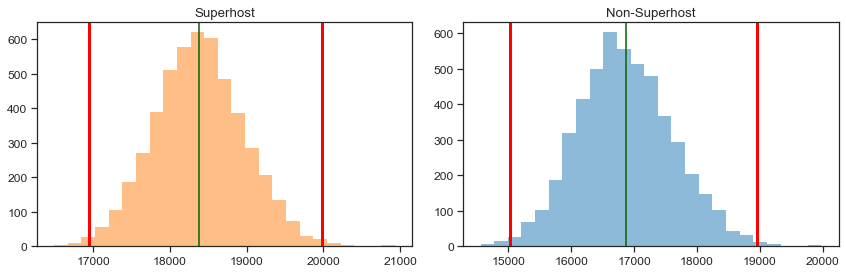

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


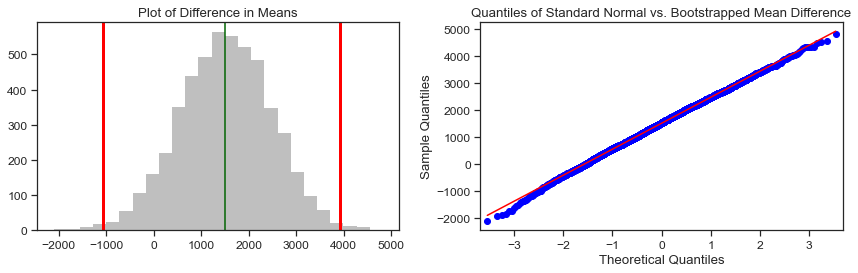

In [45]:
# Bootstrapping Proper - Price
field = 'price'
a = lr_select[lr_select.host_is_superhost == 'Superhost'][field]
b = lr_select[lr_select.host_is_superhost == 'Non-Superhost'][field]
bootstrap_meandiff(a, b, n=5000, labels=['Superhost', 'Non-Superhost'], p=1)

The bootstrapped mean price plots show and overlap between Superhosts and Non-Superhosts. Moreover, the 99% confidence interval for the difference in means straddles 0 which therefore indicates that price means of the two host types are not significantly different from each other, consistent with the results found using Welch's *t*-test. Thus, the hypothesis that the mean price of Superhosts and non-Superhosts are equal cannot be dismissed out of hand.

**Figure 19. Sampling Distributions of Mean Overall Experience Score Using Bootstrapping**

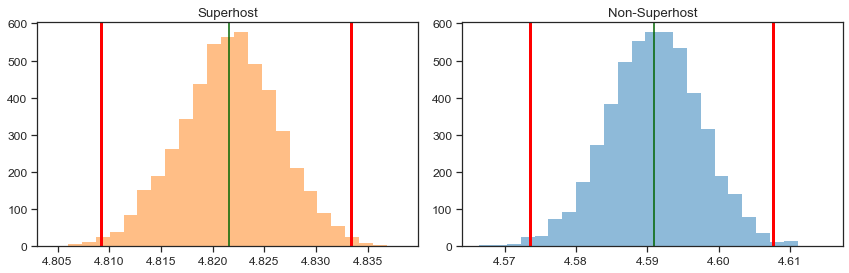

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


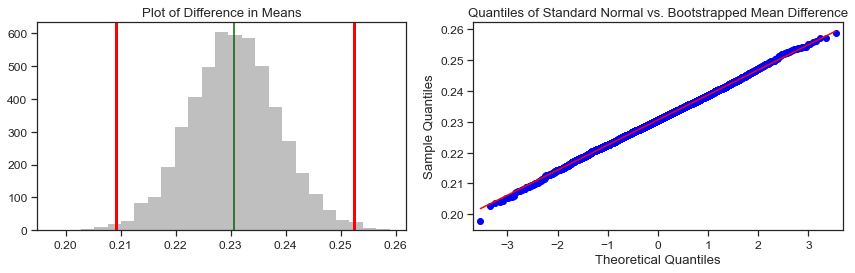

In [46]:
# Bootstrapping Proper - Overall Experience Scores
field = 'review_scores_rating'
c = lr_select[lr_select.host_is_superhost == 'Superhost'][field]
d = lr_select[lr_select.host_is_superhost == 'Non-Superhost'][field]
bootstrap_meandiff(c, d, n=5000, labels=['Superhost', 'Non-Superhost'], p=1)

Bootstrapping the mean overall experience ratings show separation in the sampling distributions between Superhosts and Non-Superhosts. This  provides evidence that the minimum requirement on scores are indeed being met since the minimum bootstrapped mean review score for Superhosts stands at around 4.8. The 99% CI for difference in means does not include 0, therefore we can say that the difference in mean overall experience ratings between Superhosts and Non-Superthosts are statistically significant. Also, on average, Superhosts are being rated around 0.23 “stars” (out of 5 stars) higher than non-Superhosts.

### **8.2 Use of Cross-Validation in Predicting Host Type and Measuring Predictive Accuracy**

Ultimately, the area of interest in this study is to determine how Superhosts and non-Superhosts compare in terms of features. The features of price and overall rating score (and to some extent, room type), have been explored rather extensively, however there are many other features in the dataset. To further explore the relationship whether a listing is managed by a Superhost or non-Superhost and the available dataset features, a classifier model was built see if the host type may be predicted by the available data. This model, as well as the resulting accuracy measurement, was considered useful in providing insight on the relationship between the dataset features and the host type.

For the classifer, the Gradient Boosting Method, a popular ensemble decision tree model, was used due to its tendency to provide good accuracy. To properly measure the model accuracy and avoid regions of overfitting or underfitting, cross-validation was performed using **Stratified Shuffle Split cross-validation**. This is similar to **Monte Carlo cross-validation** in randomizing the train and test splits, but it preserves the percentages of samples in each class (Superhost vs Non-Superhost). For this model and cross-validation approach, 10 trials and a stratified randomized train-test split of 75-25 was used.

The plot below shows the test and train accuracy with respect to different values of the tuned hyperparameter (`max_depth`).

**Figure 20. Plot of Gradient Boosting Method Classifer Model Results**

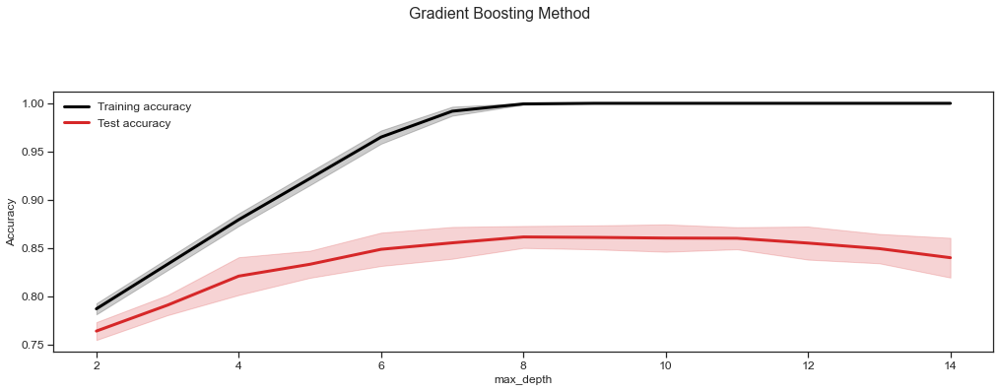

In [47]:
# GBM Modeling Data Sets
X = lr_select[fields_corr]
y = pd.get_dummies(lr_select['host_is_superhost'], drop_first=True)['Superhost']


def train_GB():
    steps = [('scaler', StandardScaler()),
             ('GB', GradientBoostingClassifier(random_state=1))]
    pipeline = Pipeline(steps)

    param_range = range(2, 15)
    model = 'Gradient Boosting Method'
    hyperparam = 'max_depth'
    params = {'GB__max_depth': param_range}

    cv = StratifiedShuffleSplit(n_splits=10, test_size=0.25)

    grid_search = GridSearchCV(pipeline, refit=True, param_grid=params,
                               cv=cv, return_train_score=True)
    grid_search.fit(X, y)

    results_df = pd.DataFrame(grid_search.cv_results_)
    results_df = (results_df[['params', 'rank_test_score',
                              'mean_train_score', 'std_train_score',
                              'mean_test_score', 'std_test_score']])

    fig, ax = plt.subplots(figsize=(15, 6))
    ax.plot(param_range, results_df['mean_train_score'],
            label="Training accuracy", lw=3.0, color='black')
    ax.plot(param_range, results_df['mean_test_score'],
            label="Test accuracy", lw=3.0, color='tab:red')
    ax.fill_between(param_range,
                    results_df['mean_train_score'] - 2*results_df['std_train_score'],
                    results_df['mean_train_score'] + 2*results_df['std_train_score'],
                    alpha=0.2,
                      color='black')
    ax.fill_between(param_range,
                    results_df['mean_test_score'] - 2*results_df['std_test_score'],
                    results_df['mean_test_score'] + 2*results_df['std_test_score'],
                    alpha=0.2,
                    color='tab:red')
    plt.ylabel("Accuracy", fontsize=12)
    plt.xlabel(hyperparam, fontsize=12)
    plt.suptitle(model)
    plt.legend()
    plt.tight_layout(pad=3)
    plt.show()

    results_df = results_df.sort_values(by=['rank_test_score']).reset_index(drop=True)
    return results_df


GB_results = train_GB()

The plot shows the train and test performance of the model at different values of `max_depth`, with bands to indicate the sampling distribution, as represented by 2 standard deviations above and below the mean accuracy based on the number of trials used in cross-validation. (Note that two standard deviations above and below the mean corresponds to approximately a 95% confidence interval when applied to the normal distribution.)  It appears that the training accuracy, while steadily narrow at first, becomes very precise (as well as constintently high, at or near 100%) at higher values of `max_depth`, with the distribution narrowing to the point of seeming almost negligible past `max_depth` = 8.  The test accuracy score, meanwhile, remains more or less "steadily uneven" throughout, narrowing and widening very slightly with no clear pattern (but always displaying greater dispersion than the training accuracy scores, as is typical when cross-validating machine learning models). It may also be observed that the train and test accuracy confidence intervals overlaps at `max_depth` = 2, indicating a region of underfitting, whereas overfitting is visibly perceptible at values of `max_depth` greater than 12.

**Table 17. Ranked Table of Gradient Boosting Method Classifer Test and Training Accuracy**

In [48]:
GB_results

,params,rank_test_score,mean_train_score,std_train_score,mean_test_score,std_test_score
0,{'GB__max_depth': 8},1,0.999395,0.000403,0.861366,0.005698
1,{'GB__max_depth': 9},2,1.000000,0.000000,0.860943,0.006207
2,{'GB__max_depth': 10},3,1.000000,0.000000,0.860218,0.007106
3,{'GB__max_depth': 11},4,1.000000,0.000000,0.860036,0.005725
4,{'GB__max_depth': 7},5,0.991818,0.002338,0.855260,0.008251
5,{'GB__max_depth': 12},6,1.000000,0.000000,0.855018,0.008579
6,{'GB__max_depth': 13},7,1.000000,0.000000,0.849274,0.007614
7,{'GB__max_depth': 6},8,0.964954,0.003451,0.848549,0.008645
8,{'GB__max_depth': 14},9,1.000000,0.000000,0.839843,0.010305
9,{'GB__max_depth': 5},10,0.921967,0.003447,0.833011,0.007024


In [49]:
PCC = np.sum((y.value_counts()/np.sum(y.value_counts()))**2)
print('PCC = ' + str(PCC) + ', 1.25*PCC = ' + str(1.25*PCC))

PCC = 0.529462533757159, 1.25*PCC = 0.6618281671964488


Ultimately, the best performance was observed at `max_depth = 9`, with the Gradient Boosting classifier achieving the maximum test accuracy of 0.865, with a standard deviation of 0.0066. The adjacent values of `max_depth` achieved similar scores as well, all exceeding the target of 1.25 multpied by the Proportional Chance Criterion (PCC) of 0.66. This indicates  that the various features explored in the EDA portion of this study are fairly good predictors of whether a listing is managed by a Superhost or otherwise, comfortably beating random chance.

## Results and Discussion

From the **Exploratory Data Analysis**, the following are observed:

- Geographically, there is no obvious pattern in the distribution of listings managed by Superhosts and non-Superhosts. However, listings in general to tend to clsuter around popular neighborhoods such as Asakusa-Akihabara, Shinjukum and Ikebukuro.
- There are more listings managed by Superhosts, comprising 62% of the dataset. Also, the most common room type for Airbnb listings is "Entire home/apartment", followed by "Private room".
- Most numerical features of the dataset are highly asymmetric, with very high frequency at "typical" values for listing characteristics, while being skewed by outliers. For instance, it can be seen that most (but not all) Airbinb listing in Tokyo:
  - accommodates 2-4 guests
  - allow for 1-2 nights minimum stay
  - have earned less then 100 reviews
  - have hosts who managed 20 or less listings
  - have hosts who respond close to 100% of inquiries
  - have 1-3 bedrooms and bathrooms

- The distribution of listing prices are asymmetric as well, for both Superhosts and non-Superhosts, with outliers priced at over 3 standard deviations above the mean. That said, there does not appear to be a clear pattern in the geographical distribution of prices.
- Some rating criteria, namely check-in and communication have narrower distributions compared to those for cleanliness, location, and value, which show higher dispersion. 
- Also, overall experience rating scores are asymmetric, tending towards values between 4 and 5, but skewing to the left, especially for non-Superhosts.
- Review scores tend to be strongly correlated, but to varying degrees. Capacity-related features also tend to be strongly correlated.

From **Hypothesis Testing**, at a 99% level of confidence, the following inferences were made:

- Room type and host type are not independent. Superhosts or observed to manage a higher proportion of entire homes and apartments, while non-Superhosts manage a higher proportion of hotel rooms, private rooms, and shared rooms. The lack of independence between the two variables indicate that one or more of these differences in proportions are statistically significant.
- Prices and overall rating scores are not normally distributed, for both Superhosts and non-Superhosts.
- Prices tend to follow Exponentiated Weibull distributions, although with different parameters for Superhosts and non-Superhosts. No well-fitting distribution could be found for overall experience review scores.
- The distribution of Superhost prices appears to be stochastically less than the distribution of non-Superhost prices. That said, there is not sufficient evidence to reject the hypothesis that their means are unequal.
- The distribution of Superhost overall experience scores appears to be stochastically less than the distribution of non-Superhost overall experience scores. Furthermore, their means are unequal, with Superhosts expectedly earning higher review scores.

From applying **Resampling techniques**, the following findings were made:

- Similar to the results found when performing a test of hypothesis comparing their means, the sampling distribution of prices cannot be confirmed to be unequal for Superhosts and non-Superhosts, at a 95% level of confidence.
- As expected, the sampling distribution of Superhost overall rating scores has a higher central location that that of non-Superhost overall rating scores.
- A predictive model can be made to classify listings as being managed by a Superhost or non-Superhost based on the available features, with the mean accuracy being in the vicinity of 86.5%, and with accuracy standard deviations consistently below 1%. This is based on stratified random splits used for cross-validation, applying a 75%-25% train-test split and 10 trials.

## Conclusion and Recommendations

This exploratory study on Tokyo's Airbnb listings revealed a number of interesting insights into the similarities and differences of Superhost and Non-Superhost listings.

First of all, one might observe that although Superhosts provide consistently better service and receive better review scores, this does not necessarily translate into these hosts charging  higher prices. It may be that providing good value for money is part of the positive experience these hosts provide, for which they are rewarded by an increased number of bookings, in turn earning them more positive reviews, fueling a virtuous cycle.

One also notes that the strategies adopted by Superhosts and non-Superhosts in terms of the types of listings they manage are different to some extent. More Superhosts were observed to allow guests to book entire homes and apartment (as opposed to letting guests stay in a shared room or a private room within a shared home, or a hotel room). This may be a potential sign of Superhosts being more committed to the Airbnb platforming, by investing in entire properties to be opened up to guests. It is pleasant to imagine that this is also where the culture of *omotenashi* comes in, which allows Superhosts to earn high review scores despite perhaps fewer opportunties for personal touches affored by on-site interaction.

Further studies can be performed to examine and confirm the utilization and effectiveness of these "Superhosting" strategies further.

Also, although this study focuses on exploratory data analysis, it may be a good avenue to venture to further investigation of this data set by doing the following:

1. Perform outlier analysis to better evaluate which methods to apply to this data set.
2. Perform cluster analysis and evaluate if characteristics of formed clusters would be better in segmenting the listings.
3. Explore in greater depth the distributions of other features, aside from Price and Overall Experience Ratings.
6. Create prediction models for price, to see if the features that stand out in this study, like `number of reviews`, capacity features (`accommodates`, `bedrooms`, `beds`, and `bathrooms`), and `amenities_ct` also influence price.

## References

[1] "New Record for International Visitors to Japan", 2020, https://www.nippon.com/en/japan-data/h00631/new-record-for-international-visitors-to-japan.html    
[2] "What is a Superhost", https://www.airbnb.com/help/article/828/what-is-a-superhost  
[3] Airbnb, https://news.airbnb.com/about-us/  
[4] "Airbnb removes 80% of Japan home-share listings", 2018, https://asia.nikkei.com/Spotlight/Most-read-in2018/Airbnb-removes-80-of-Japan-home-share-listings  
[5] "Airbnb says it’s back in business in Japan", 2019, https://www.bworldonline.com/airbnb-says-its-back-in-business-in-japan/  
[6] Inside Aibnb, http://insideairbnb.com/about.html  
[7] Airbnb Star Ratings, https://www.airbnb.com/help/article/1257/star-ratings  
[8] "Making reviews more fair for hosts", 2019, https://www.airbnb.com/resources/hosting-homes/a/making-reviews-more-fair-for-hosts-93  
[9] Ratner, B. (2009, May), "The correlation coefficient: Its values range between +1/−1, or do they?", https://link.springer.com/article/10.1057/jt.2009.5  
[10] Scipy Stats Documentation, https://docs.scipy.org/doc/scipy/reference/stats.html  
[11] ResearchGate, "Can I use the T-Test and the Mann-Whitney in the same analysis?" https://www.researchgate.net/post/Can_I_use_the_T-Test_and_the_Mann-Whitney_in_the_same_analysis  
[12] Statistics Libretexts, "4.2: Two-Sample t-Test", https://stats.libretexts.org/Bookshelves/Applied_Statistics/Book%3A_Biological_Statistics_(McDonald)/04%3A_Tests_for_One_Measurement_Variable/4.02%3A_Two-Sample_t-Test  
[13] Wikipedia, "Mann-Whitney U Test", https://en.wikipedia.org/wiki/Mann%E2%80%93Whitney_U_test#Comparison_to_Student's_t-test  
[14] Wikipedia, "Welch's t-test", https://en.wikipedia.org/wiki/Welch%27s_t-test

## Acknowledgements

Big thanks to:
* Prof. Christian Alis, for imparting to his students the fundamentals of Data Mining and Wrangling.
* Leo Lorenzo II, for always being available to his mentees for questions and consultations.
* Mike Dorosan, for providing guidance on the game plan for this study.
* Prof. Sebastian Ibanez, for guiding his students on the theory and application of computational statistics in data science, and for being very cool.